# <font color=BLUE size=10> 7ª Competição FLAI de 
# <font color=BLUE size=12> MACHINE LEARNING

***
**Author**: [Camila Maestrelli](https://www.linkedin.com/in/camila-maestrelli-leobons/)

Este notebook é relativo à Competição de Machine Learning da Flai - 

## Etapas do projeto:

### 1. Definição do problema
### 2. Importação dos dados
### 3. Limpeza dos dados, Análise exploratória e pré-processamento
### 5. Algoritmo e criação do modelo
### 6. Interpretação dos resultados e avaliação dos modelos

#### Neste notebook, somente será abordado até a Análise exploratória dos dados

## <font color=green> 1. Definição do Problema

### Objetivo da Competição: 

Achar um modelo com menor EMA (Erro Médio Absoluto)

## Dados

- Dados de treinamento: (15000, 11) - variável resposta “remuneracao”
- Dados de teste: (15000, 10), não contém a variável resposta

## Variáveis

> ### Sexo
> ***

|Código|Descrição|
|---|---|
|1|Masculino|
|2 (0)|Feminino|

> ### Idade
> ***

Idade do indivíduo em anos

> ### Faixa Etária
> ***

|Código|Descrição|
|---|---|
|1|10 a 14 anos|
|2|15 a 17 anos|
|3|18 a 24 anos|
|4|25 a 29 anos|
|5|30 a 39 anos|
|6|40 a 49 anos|
|7|50 a 64 anos|
|8|65 anos ou mais|

> ### Cor-raça
> ***

|Código|Descrição|
|---|---|
|1|Indígena|
|2|Branca|
|4|Preta|
|6|Amarela|
|8|Parda|
|9|Não identificado|
|99|Ignorado|

> ### Escolaridade
> ***

|Código|Descrição|
|---|---|
|1|Analfabeto|
|2|Até 5ª incompleto|
|3|5ª fund|
|4|5ª a 9ª fund|
|5|fund completo|
|6|médio incompleto|
|7|médio completo|
|8|superior incompleto|
|9|superior completo|
|10|mestrado|
|11|doutorado|

> ### Horas de trabalho por semana
> ***

Tempo trabalho por semana em horas

> ### Portador de deficiência
> ***

|Código|Descrição|
|---|---|
|0|Não|
|1|Sim|

> ### Tamanho da empresa
> ***

|Código|Descrição|
|---|---|
|2|Até 4|
|3|de 5 a 9|
|4|de 10 a 19|
|5|de 20 a 49|
|6|de 50 a 99|
|7|de 100 a 249|
|8|de 250 a 499|
|9|de 500 a 999|
|10|1000 ou mais|

> ### Tempo no emprego
> ***

Tempo na empresa em meses

> ### Remuneração: variável dependente
> ***

Remuneração do indivídeo em reais

> ### ID
> ***

id de indivíduo

## <font color=green> 2. Importar os dados 

In [1]:
import numpy as np
import pandas as pd

# visualization libraries
import matplotlib.pyplot as plt
import seaborn as sns
import sweetviz as sv


# Machine Learning library
from sklearn.ensemble import RandomForestRegressor, ExtraTreesRegressor, BaggingRegressor,GradientBoostingRegressor, AdaBoostRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.linear_model import LinearRegression

from sklearn.model_selection import cross_validate, RepeatedKFold, KFold, cross_val_predict

from sklearn.neural_network import MLPRegressor

!pip install lightgbm
from lightgbm.sklearn import LGBMRegressor
!pip install xgboost
from xgboost import XGBRegressor

from sklearn.ensemble import VotingRegressor

from sklearn.preprocessing import StandardScaler, QuantileTransformer, PowerTransformer
from sklearn.compose import TransformedTargetRegressor
from sklearn.pipeline import Pipeline

from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV
from sklearn.impute import KNNImputer

#metrics
from sklearn.metrics import mean_absolute_error , r2_score, mean_squared_error

# anova testing
import scipy.stats as stats

import warnings
from datetime import datetime

warnings.filterwarnings(action = 'once')

In [3]:
# urls containing the datasets
train_url = 'https://raw.githubusercontent.com/camilamaestrelli/Wage-Prediction-a-Regression-Competition/master/treino.csv'
test_url = 'https://raw.githubusercontent.com/camilamaestrelli/Wage-Prediction-a-Regression-Competition/master/teste.csv'

# importing dataset
original_train = pd.read_csv(train_url)
original_test = pd.read_csv(test_url)

# copying the datsets
df_train = original_train.copy()
df_test = original_test.copy()

## <font color=green> 3. EDA: Análise exploratória dos dados

In [4]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15000 entries, 0 to 14999
Data columns (total 11 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   sexo                       15000 non-null  int64  
 1   idade                      15000 non-null  int64  
 2   faixa_etaria               15000 non-null  int64  
 3   cor_raca                   15000 non-null  int64  
 4   escolaridade               15000 non-null  int64  
 5   horas_trabalho_por_semana  15000 non-null  int64  
 6   portador_de_deficiencia    15000 non-null  int64  
 7   tamanho_da_empresa         15000 non-null  int64  
 8   tempo_no_emprego           15000 non-null  float64
 9   remuneracao                15000 non-null  float64
 10  id                         15000 non-null  int64  
dtypes: float64(2), int64(9)
memory usage: 1.3 MB


In [5]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15000 entries, 0 to 14999
Data columns (total 10 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   sexo                       15000 non-null  int64  
 1   idade                      15000 non-null  int64  
 2   faixa_etaria               15000 non-null  int64  
 3   cor_raca                   15000 non-null  int64  
 4   escolaridade               15000 non-null  int64  
 5   horas_trabalho_por_semana  15000 non-null  int64  
 6   portador_de_deficiencia    15000 non-null  int64  
 7   tamanho_da_empresa         15000 non-null  int64  
 8   tempo_no_emprego           15000 non-null  float64
 9   id                         15000 non-null  int64  
dtypes: float64(1), int64(9)
memory usage: 1.1 MB


In [6]:
df_train.describe()

,sexo,idade,faixa_etaria,cor_raca,escolaridade,horas_trabalho_por_semana,portador_de_deficiencia,tamanho_da_empresa,tempo_no_emprego,remuneracao,id
count,15000.000000,15000.00000,15000.000000,15000.000000,15000.000000,15000.000000,15000.000000,15000.000000,15000.000000,15000.000000,1.500000e+04
mean,1.418467,38.47240,5.268467,37.277533,7.066533,39.171600,0.007867,7.102800,83.200600,3048.329903,1.230351e+06
std,0.493324,11.59629,1.268003,43.163674,1.619593,7.780124,0.088348,2.709721,100.756705,3783.080296,7.081270e+05
min,1.000000,14.00000,1.000000,1.000000,1.000000,0.000000,0.000000,2.000000,0.000000,301.430000,2.200000e+01
25%,1.000000,29.00000,4.000000,8.000000,7.000000,37.000000,0.000000,5.000000,12.700000,1274.707500,6.237862e+05
50%,1.000000,37.00000,5.000000,8.000000,7.000000,44.000000,0.000000,8.000000,40.700000,1764.360000,1.238586e+06
75%,2.000000,46.00000,6.000000,99.000000,8.000000,44.000000,0.000000,10.000000,118.900000,3213.360000,1.841327e+06
max,2.000000,84.00000,8.000000,99.000000,11.000000,44.000000,1.000000,10.000000,596.500000,63218.070000,2.459844e+06


In [7]:
df_test.describe()

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,sexo,idade,faixa_etaria,cor_raca,escolaridade,horas_trabalho_por_semana,portador_de_deficiencia,tamanho_da_empresa,tempo_no_emprego,id
count,15000.000000,15000.000000,15000.000000,15000.000000,15000.000000,15000.000000,15000.000000,15000.000000,15000.000000,1.500000e+04
mean,1.420067,38.317933,5.245267,36.888133,7.053200,39.210667,0.009000,7.079533,82.497840,1.232262e+06
std,0.493586,11.629445,1.278809,43.003144,1.612372,7.674804,0.094444,2.705296,100.945231,7.068442e+05
min,1.000000,15.000000,2.000000,1.000000,1.000000,0.000000,0.000000,2.000000,0.200000,7.200000e+01
25%,1.000000,29.000000,4.000000,8.000000,7.000000,36.000000,0.000000,5.000000,12.400000,6.260040e+05
50%,1.000000,37.000000,5.000000,8.000000,7.000000,44.000000,0.000000,8.000000,39.400000,1.233154e+06
75%,2.000000,46.000000,6.000000,99.000000,8.000000,44.000000,0.000000,10.000000,116.900000,1.846926e+06
max,2.000000,84.000000,8.000000,99.000000,11.000000,44.000000,1.000000,10.000000,596.500000,2.459848e+06


In [8]:
df_train.head()

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,sexo,idade,faixa_etaria,cor_raca,escolaridade,horas_trabalho_por_semana,portador_de_deficiencia,tamanho_da_empresa,tempo_no_emprego,remuneracao,id
0,1,31,5,8,7,44,0,10,3.8,2551.21,1559958
1,1,58,7,8,7,44,0,3,1.9,3248.53,520410
2,2,58,7,99,7,30,0,7,255.9,1662.69,2373235
3,1,29,4,8,7,44,0,8,0.4,918.82,1358000
4,1,54,7,99,9,40,0,10,132.9,6479.11,155786


In [9]:
df_test.head()

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,sexo,idade,faixa_etaria,cor_raca,escolaridade,horas_trabalho_por_semana,portador_de_deficiencia,tamanho_da_empresa,tempo_no_emprego,id
0,1,43,6,8,7,44,0,5,9.9,344549
1,1,34,5,2,8,44,0,2,40.3,2135750
2,2,59,7,99,9,30,0,10,367.8,2057284
3,1,49,6,8,7,44,0,10,131.1,1591618
4,1,50,7,8,7,42,0,10,10.0,1461698


### EMA básico de partida



Com esse teste inicial, podemos partir de um EMA máximo de 1328 como base para nosso modelo, visto que a base de dados ainda não foi tratada

In [11]:
X = df_train.drop(columns = ['remuneracao', 'id'], axis = 1)
y =df_train['remuneracao']

validacao = RepeatedKFold(n_splits = 5, n_repeats = 2)

modelo = GradientBoostingRegressor(n_estimators = 50, min_samples_split = 7, min_samples_leaf = 4, 
                                   max_features = 'log2', max_depth = 12, loss = 'huber', learning_rate = 0.1)

medidas = cross_validate(modelo, X, y, cv = validacao, scoring = 'neg_mean_absolute_error')

print(abs(medidas['test_score'].mean()).round(2))
print(abs(medidas['test_score'].std()).round(2))


C:\ProgramData\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


1328.68
36.83


### Observando a presença de <font color=red>valores duplicados</font> no dataset de teste em relação ao de treino

In [44]:
df = pd.concat([df_train, df_test])
df.head()

,sexo,idade,faixa_etaria,cor_raca,escolaridade,horas_trabalho_por_semana,portador_de_deficiencia,tamanho_da_empresa,tempo_no_emprego,remuneracao,id,remuneracao_log
0,1,31,5,8,7,44,0,10,3.8,2551.21,1559958,7.844323
1,1,58,7,8,7,44,0,3,1.9,3248.53,520410,8.085958
2,2,58,7,99,7,30,0,7,255.9,1662.69,2373235,7.416192
3,1,29,4,8,7,44,0,8,0.4,918.82,1358000,6.823090
4,1,54,7,99,9,40,0,10,132.9,6479.11,155786,8.776338


In [45]:
indices_duplicados = df.id.value_counts()[df.id.value_counts()>1].index
indices_duplicados

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Int64Index([ 626686, 1793596,  871998,  917933,  634527, 1914269, 1077972,
            2307649, 1556125, 2137668,
            ...
             247456,  346467,  299200,  724926, 2229550, 2108213,   51619,
            1048770, 1261986, 1496756],
           dtype='int64', length=7483)

In [46]:
frames = []
for i in indices_duplicados:
    frames.append(df[df.id == i])

df_duplicado = pd.concat(frames)

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [16]:
df_duplicado[df_duplicado.horas_trabalho_por_semana == 0]

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,sexo,idade,faixa_etaria,cor_raca,escolaridade,horas_trabalho_por_semana,portador_de_deficiencia,tamanho_da_empresa,tempo_no_emprego,remuneracao,id
5591,1,42,6,8,9,0,0,9,1.9,55122.47,737660
4091,1,42,6,8,9,0,0,9,1.9,NaN,737660
9511,2,46,6,8,9,0,0,3,169.9,4751.74,953782
9770,2,46,6,8,9,0,0,3,169.9,NaN,953782
2289,1,39,5,2,7,0,0,5,193.9,5218.52,520685
...,...,...,...,...,...,...,...,...,...,...,...
6412,1,43,6,2,7,0,0,9,31.9,NaN,1402845
10437,1,37,5,8,7,0,0,5,52.8,3692.52,493995
11892,1,37,5,8,7,0,0,5,52.8,NaN,493995
12839,1,40,6,8,7,0,0,6,0.2,327.04,2246667


Foram observadas 7483 linhas duplicadas (49,9%)

In [17]:
7483 / 15000 * 100

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


49.88666666666667

In [18]:
# new dataset with only the non-duplicated train rows
df_train_nao_dup = df_train[~df_train.id.isin(indices_duplicados)]
df_train_nao_dup

,sexo,idade,faixa_etaria,cor_raca,escolaridade,horas_trabalho_por_semana,portador_de_deficiencia,tamanho_da_empresa,tempo_no_emprego,remuneracao,id
0,1,31,5,8,7,44,0,10,3.8,2551.21,1559958
2,2,58,7,99,7,30,0,7,255.9,1662.69,2373235
5,1,26,4,8,7,44,0,5,14.4,1900.88,1531046
6,2,55,7,8,4,44,0,8,51.3,1473.37,759415
8,2,50,7,99,9,30,0,10,111.8,16282.02,2208546
...,...,...,...,...,...,...,...,...,...,...,...
14994,1,37,5,8,2,44,0,10,28.5,1524.40,4630
14996,1,41,6,99,7,40,0,10,175.9,1773.77,1483323
14997,2,62,7,99,9,30,0,10,30.4,5900.66,968508
14998,1,45,6,2,7,44,0,7,21.9,3108.81,1334465


In [19]:
# new dataframe with only the non-duplicated test rows
df_test_nao_dup = df_test[~df_test.id.isin(indices_duplicados)]
df_test_nao_dup

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,sexo,idade,faixa_etaria,cor_raca,escolaridade,horas_trabalho_por_semana,portador_de_deficiencia,tamanho_da_empresa,tempo_no_emprego,id
0,1,43,6,8,7,44,0,5,9.9,344549
2,2,59,7,99,9,30,0,10,367.8,2057284
5,1,61,7,8,5,44,0,9,55.4,465086
6,2,48,6,99,9,30,0,9,18.9,970841
7,2,48,6,8,7,22,0,3,89.9,256839
...,...,...,...,...,...,...,...,...,...,...
14988,1,44,6,9,5,36,0,3,100.4,2230647
14991,2,47,6,99,9,30,0,10,9.7,927707
14993,2,39,5,99,9,40,0,10,188.3,1063164
14994,1,50,7,2,2,44,0,10,3.2,2215987


### Observando as linhas com valores iguais e remuneração diferente
Nota-se alguns valores bem destoantes

In [70]:
df_analisando = df_train.copy()
df_analisando.drop_duplicates(keep=False, inplace=True, subset = ['sexo', 'idade', 'faixa_etaria', 'cor_raca', 'escolaridade',
       'horas_trabalho_por_semana', 'portador_de_deficiencia',
       'tamanho_da_empresa', 'tempo_no_emprego'])
df_analisando.index

df_iguais = df_train[~df_train.index.isin(df_analisando.index)]
df_iguais.sort_values(by = ['sexo', 'idade', 'cor_raca', 'escolaridade', 'horas_trabalho_por_semana','portador_de_deficiencia',
                           'tamanho_da_empresa', 'tempo_no_emprego', 'remuneracao']).head(50)

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,sexo,idade,faixa_etaria,cor_raca,escolaridade,horas_trabalho_por_semana,portador_de_deficiencia,tamanho_da_empresa,tempo_no_emprego,remuneracao,id,remuneracao_log
13529,1,17,2,8,6,20,0,8,15.4,541.95,482041,6.295174
6706,1,17,2,8,6,20,0,8,15.4,542.90,481330,6.296925
7741,1,19,3,2,6,44,0,7,0.9,1135.14,35874,7.034511
12758,1,19,3,2,6,44,0,7,0.9,1286.72,41203,7.159852
8916,1,20,3,2,7,44,0,4,1.9,1155.72,1405758,7.052479
13291,1,20,3,2,7,44,0,4,1.9,1638.86,114472,7.401756
12748,1,20,3,8,7,44,0,5,1.8,1107.09,1572221,7.009490
1787,1,20,3,8,7,44,0,5,1.8,1284.97,1456574,7.158491
2353,1,21,3,8,7,44,0,10,1.4,806.44,1406115,6.692629
12799,1,21,3,8,7,44,0,10,1.4,1030.45,679600,6.937751


# <font color=green size =10> ANOVA

## Comparação dos dados de treino e teste através do ANOVA

- p < 0.5: Rejeitamos que são iguais (Ho)
- p > 0.5: Não há evidências para descartar que são iguais

### 1. não há evidências para rejeitar que as 2 sejam iguais

In [20]:
anova_orig = stats.f_oneway(df_train.drop(columns = ['remuneracao'], axis=1), df_test)
anova_orig[1] 

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


array([0.77886273, 0.24935967, 0.11462568, 0.43378785, 0.4748937 ,
       0.66152406, 0.28314469, 0.45675601, 0.54619904, 0.81501084])

### 2. a variável faixa_etaria tem um p-valor menor que 0,05 (0,026) o q sugere que as amostras são diferentes nessa variável

In [22]:
anova_dup = stats.f_oneway(df_train.drop(columns = ['remuneracao'], axis=1), df_test_nao_dup)
anova_dup[1] 

array([0.52427736, 0.21348131, 0.04615984, 0.20788616, 0.27512055,
       0.59511532, 0.6089372 , 0.10047269, 0.62635855, 0.5315584 ])

### 3. acontece o msm com a faixa_etaria aqui

In [23]:
anova_orig_dup = stats.f_oneway(df_train.drop(columns = ['remuneracao'], axis=1), df_test_nao_dup)
anova_orig_dup[1] 

array([0.52427736, 0.21348131, 0.04615984, 0.20788616, 0.27512055,
       0.59511532, 0.6089372 , 0.10047269, 0.62635855, 0.5315584 ])

In [24]:
df_train.columns

Index(['sexo', 'idade', 'faixa_etaria', 'cor_raca', 'escolaridade',
       'horas_trabalho_por_semana', 'portador_de_deficiencia',
       'tamanho_da_empresa', 'tempo_no_emprego', 'remuneracao', 'id'],
      dtype='object')

In [25]:
df_test_nao_dup[df_test_nao_dup.portador_de_deficiencia==1].describe()

,sexo,idade,faixa_etaria,cor_raca,escolaridade,horas_trabalho_por_semana,portador_de_deficiencia,tamanho_da_empresa,tempo_no_emprego,id
count,64.000000,64.000000,64.000000,64.000000,64.000000,64.000000,64.0,64.000000,64.000000,6.400000e+01
mean,1.234375,41.953125,5.640625,17.390625,6.906250,42.171875,1.0,8.218750,79.321875,1.248047e+06
std,0.426956,10.673256,1.200095,28.891487,1.399759,3.901789,0.0,1.759047,89.581132,6.875890e+05
min,1.000000,22.000000,3.000000,2.000000,1.000000,21.000000,1.0,3.000000,0.400000,2.351400e+04
25%,1.000000,34.750000,5.000000,8.000000,7.000000,41.500000,1.0,7.000000,25.425000,6.255472e+05
50%,1.000000,43.000000,6.000000,8.000000,7.000000,44.000000,1.0,9.000000,50.800000,1.275280e+06
75%,1.000000,48.250000,6.000000,8.000000,7.000000,44.000000,1.0,10.000000,86.100000,1.685908e+06
max,2.000000,71.000000,8.000000,99.000000,9.000000,44.000000,1.0,10.000000,425.600000,2.425135e+06


In [253]:
df_train[(df_train.horas_trabalho_por_semana<10) & (df_train.escolaridade >7)]

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,sexo,idade,faixa_etaria,cor_raca,escolaridade,horas_trabalho_por_semana,portador_de_deficiencia,tamanho_da_empresa,tempo_no_emprego,remuneracao,id
75,1,31,5,8,9,1,0,6,64.9,467.75,2138126
569,1,41,6,8,9,1,0,7,190.5,3614.03,1027590
598,2,43,6,9,8,6,0,7,11.4,490.15,1959372
623,2,47,6,8,11,6,0,7,146.9,2122.53,981666
710,1,51,7,2,9,0,0,6,5.6,12824.37,1670893
...,...,...,...,...,...,...,...,...,...,...,...
14429,2,27,4,2,9,5,0,6,43.9,1971.10,2061852
14525,1,60,7,8,9,2,0,6,107.9,3109.57,1651111
14530,1,30,5,8,9,1,0,5,64.9,1158.95,1619992
14875,2,34,5,2,9,1,0,7,106.9,1841.89,1072003


In [250]:
df_test_nao_dup[(df_test_nao_dup.horas_trabalho_por_semana<10) & (df_test_nao_dup.escolaridade <5)]

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,sexo,idade,faixa_etaria,cor_raca,escolaridade,horas_trabalho_por_semana,portador_de_deficiencia,tamanho_da_empresa,tempo_no_emprego,id
1120,1,55,7,8,4,0,0,7,129.9,322453
10361,1,30,5,8,4,1,0,7,5.4,1137848
13090,2,26,4,8,2,1,0,4,5.9,383668


## Observação SweetViz - Comparação treino e teste

Comparando os 2 conjuntos de dados, percebe-se que eles se distribuem de forma parecida pelas variáveis

In [26]:
# Comparing the train e test datasets
my_report = sv.compare([df_train, "Training Data"], [df_test, "Test Data"], "remuneracao")

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


                                             |                                             | [  0%]   00:00 ->…

C:\ProgramData\Anaconda3\lib\inspect.py:2999: ResourceWarning: unclosed <socket.socket fd=3360, family=AddressFamily.AF_INET6, type=SocketKind.SOCK_STREAM, proto=0, laddr=('::', 61561, 0, 0)>
  arg_val = kwargs.pop(param_name)


C:\ProgramData\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)



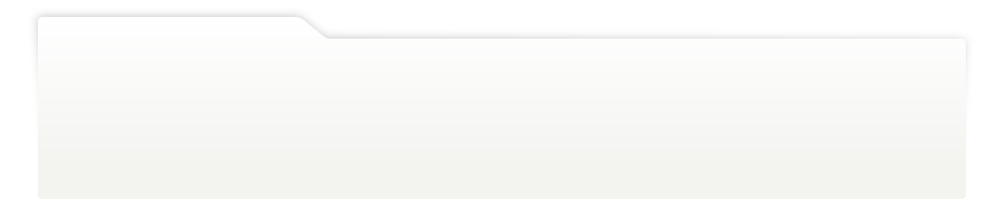
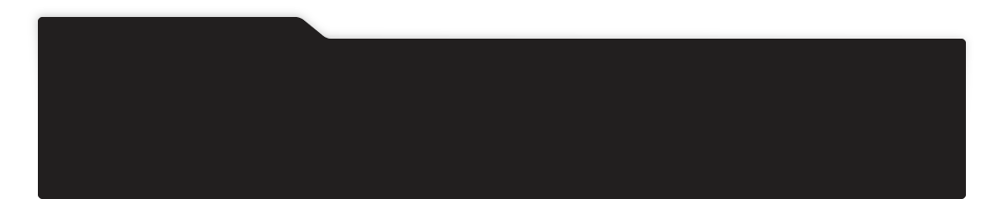
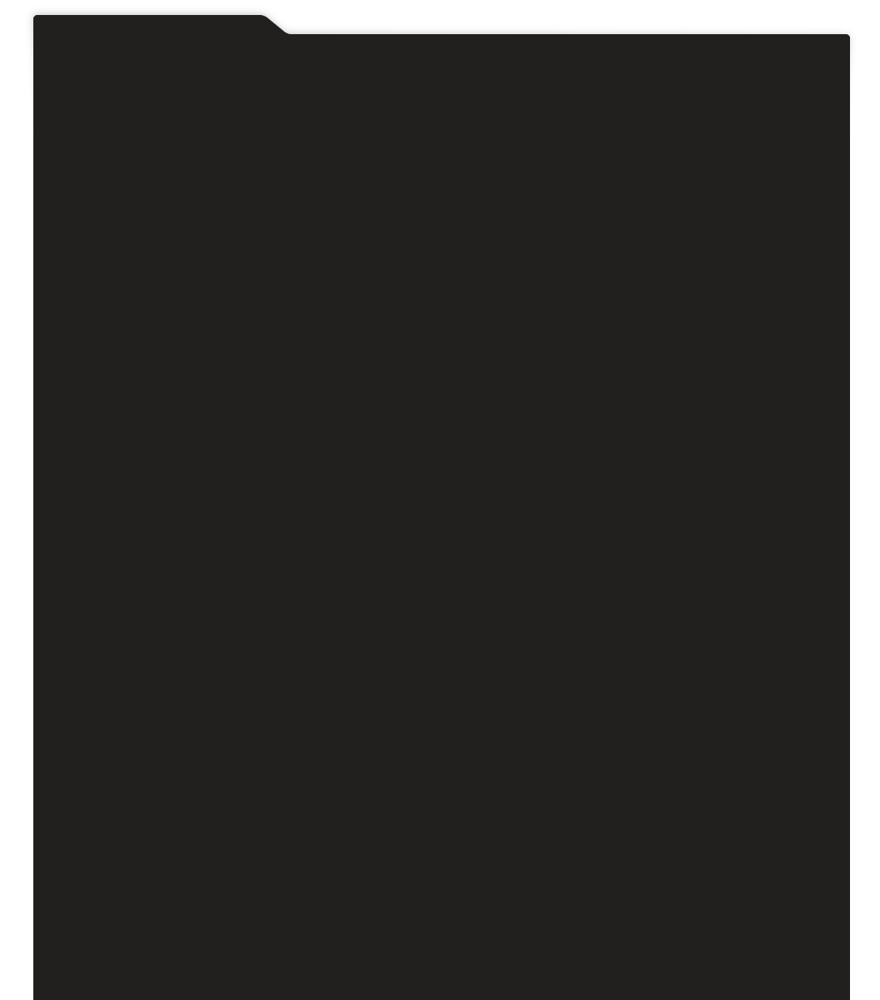
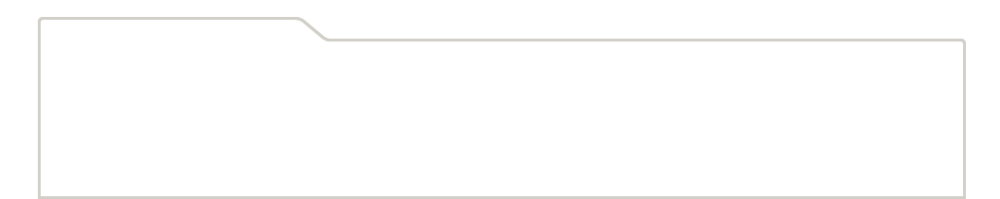
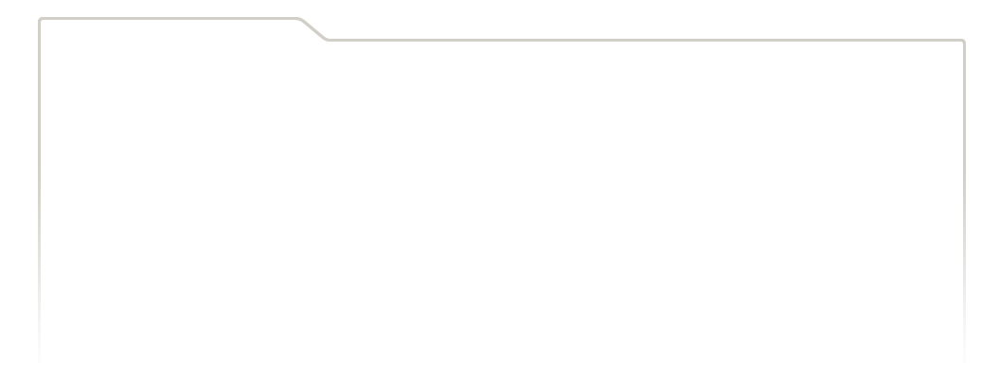
...
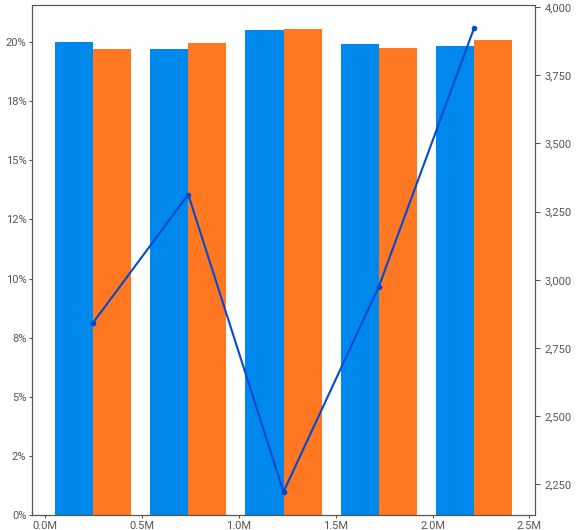
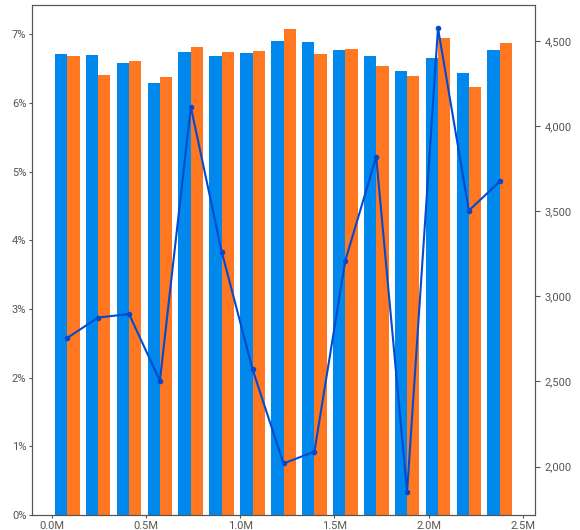
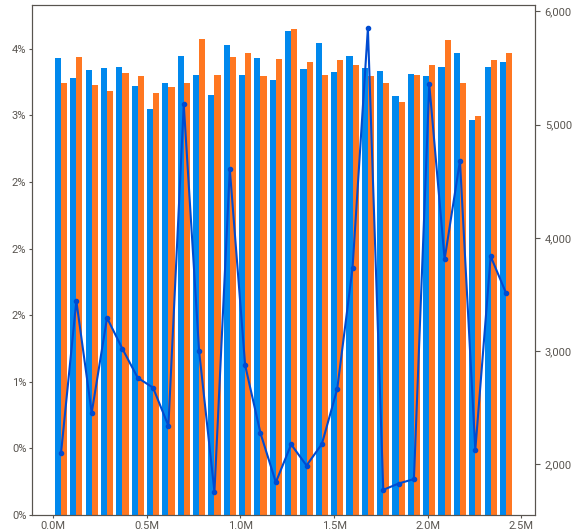
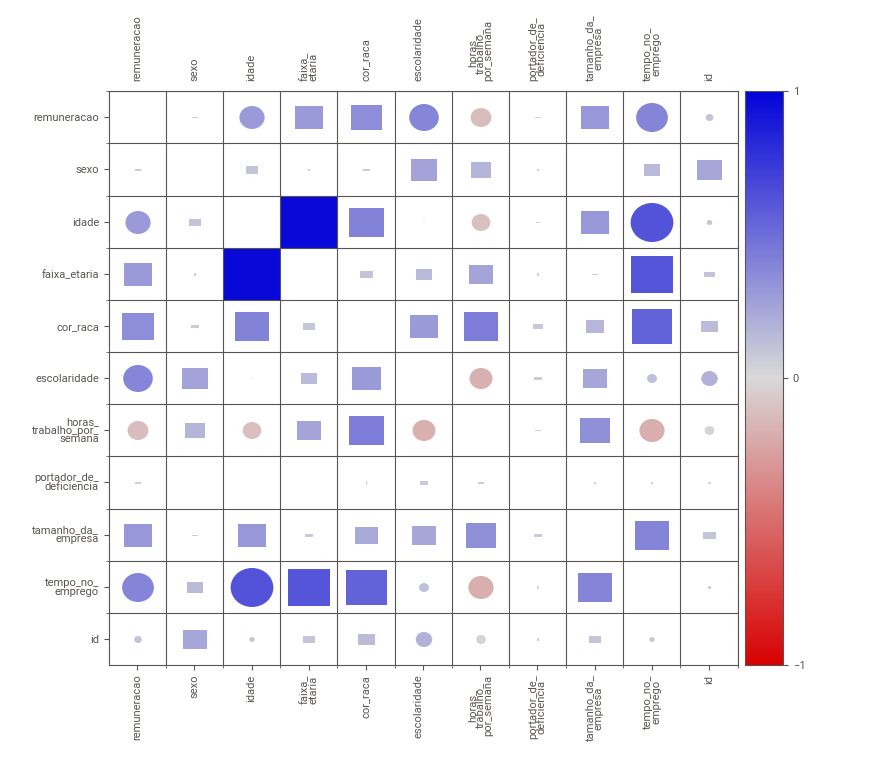
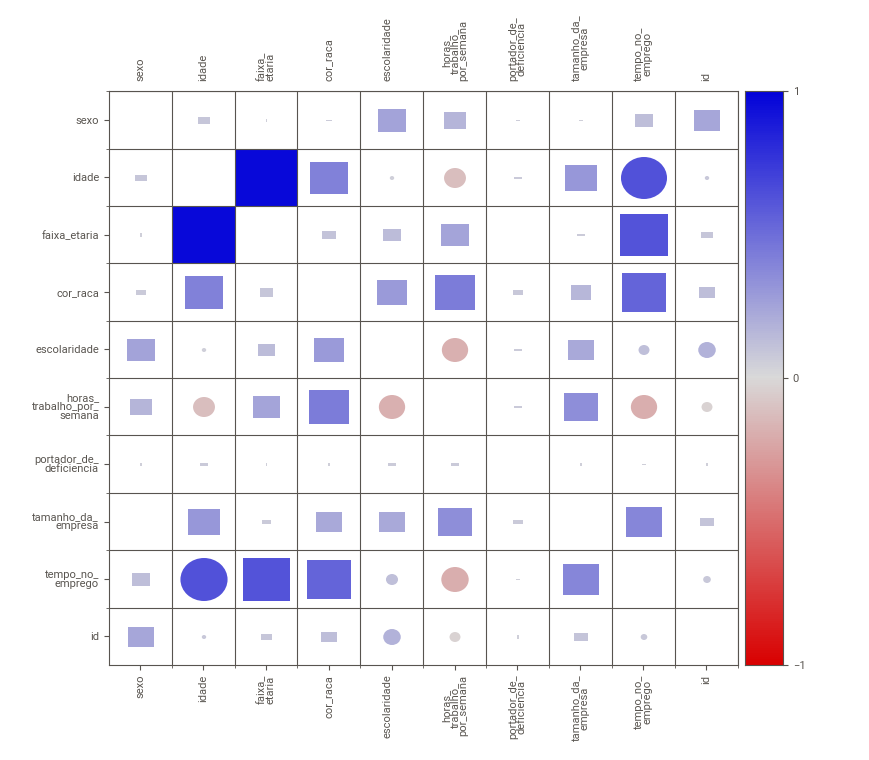

In [27]:
my_report.show_notebook()

In [29]:
# Comparing the train e test datasets: non-duplicated test dataset
eda2 = sv.compare([df_train, "Training Data"], [df_test_nao_dup, "Test Data"], "remuneracao")

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


                                             |                                             | [  0%]   00:00 ->…

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)



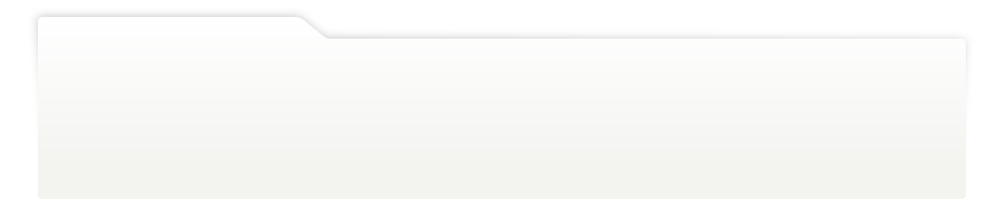
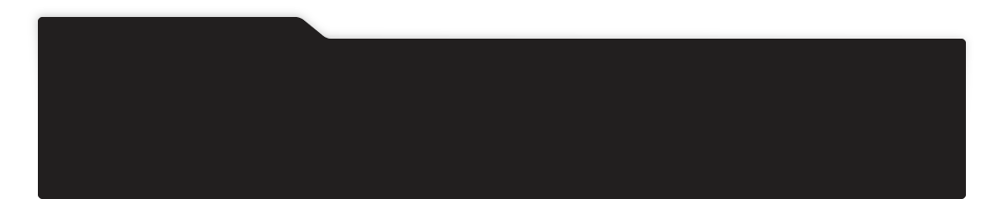
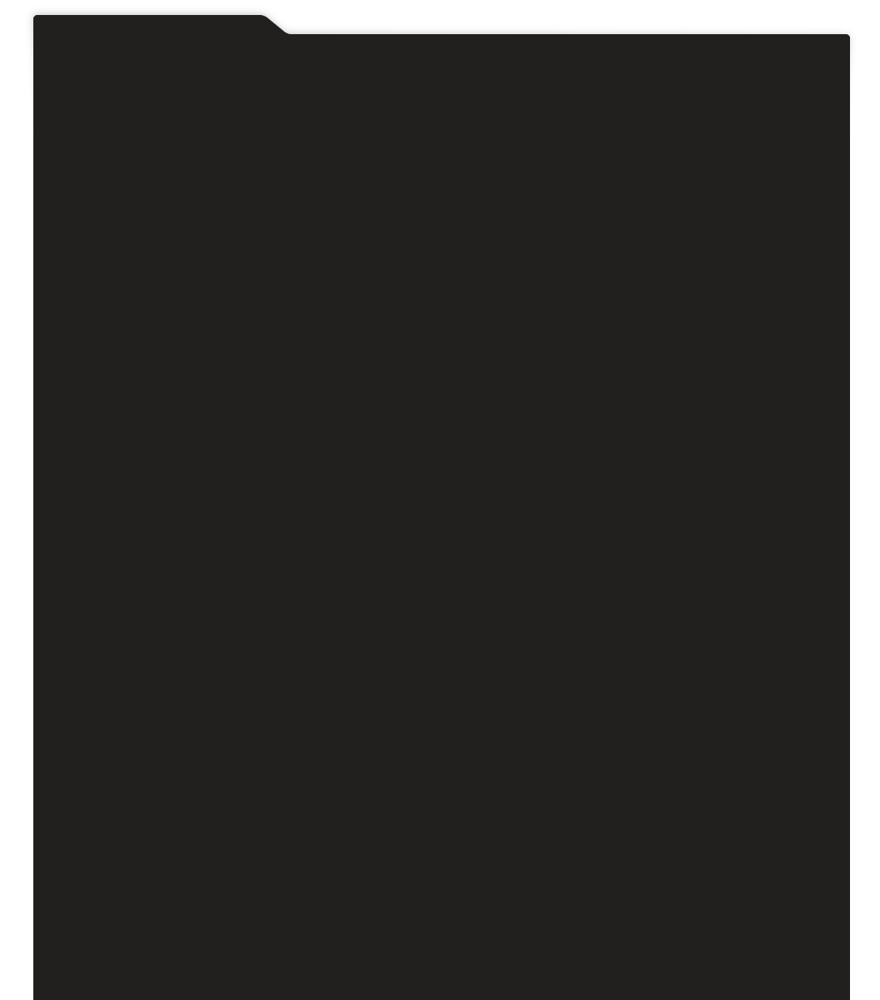
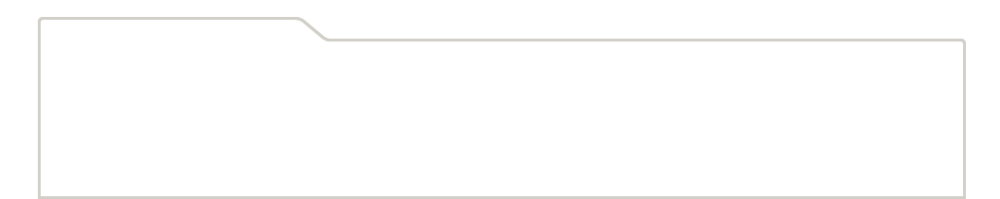
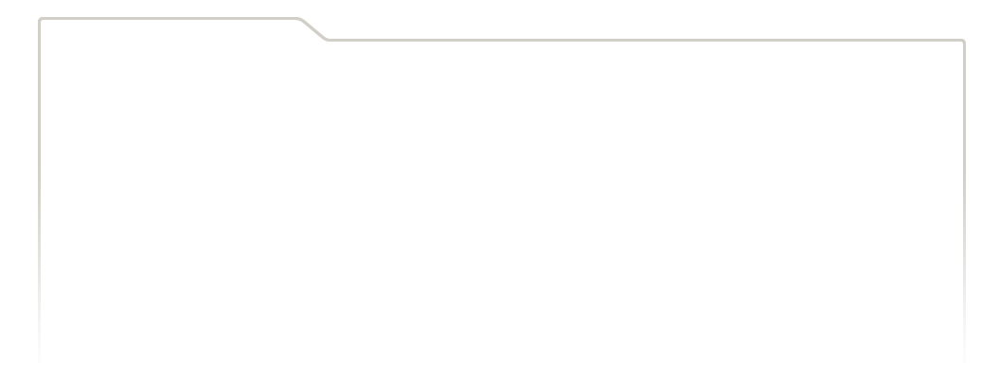
...
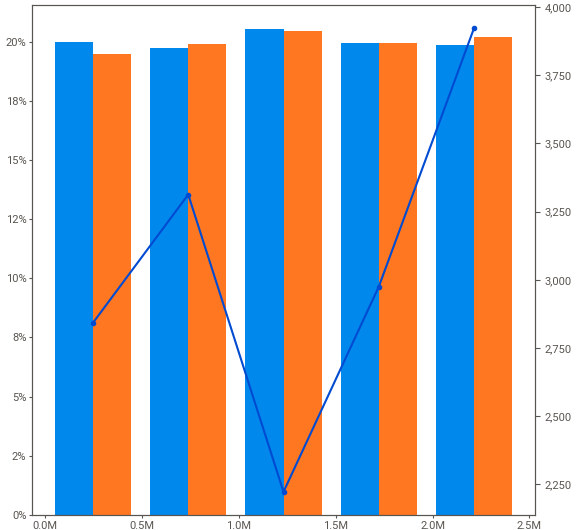
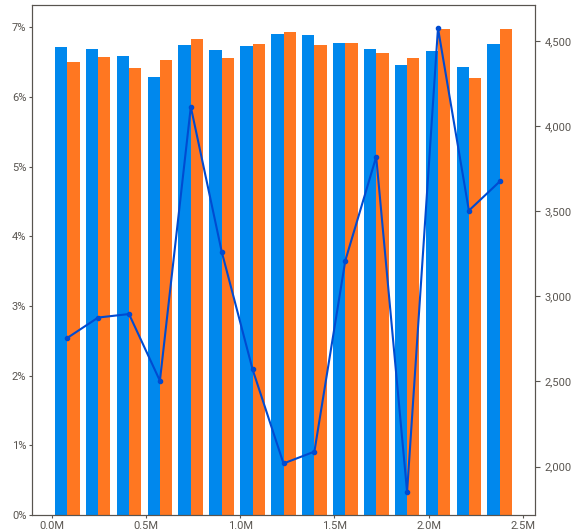
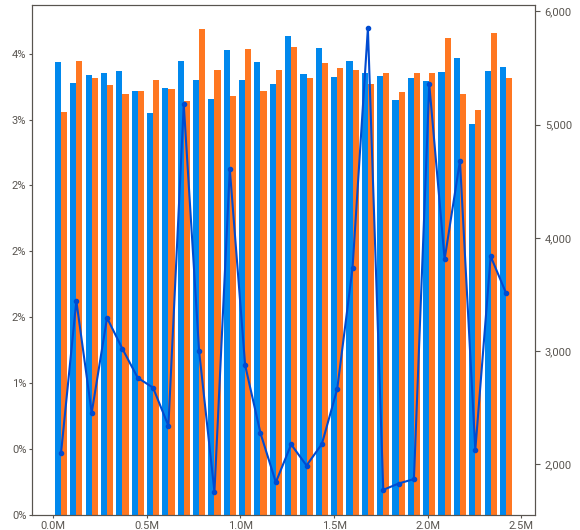
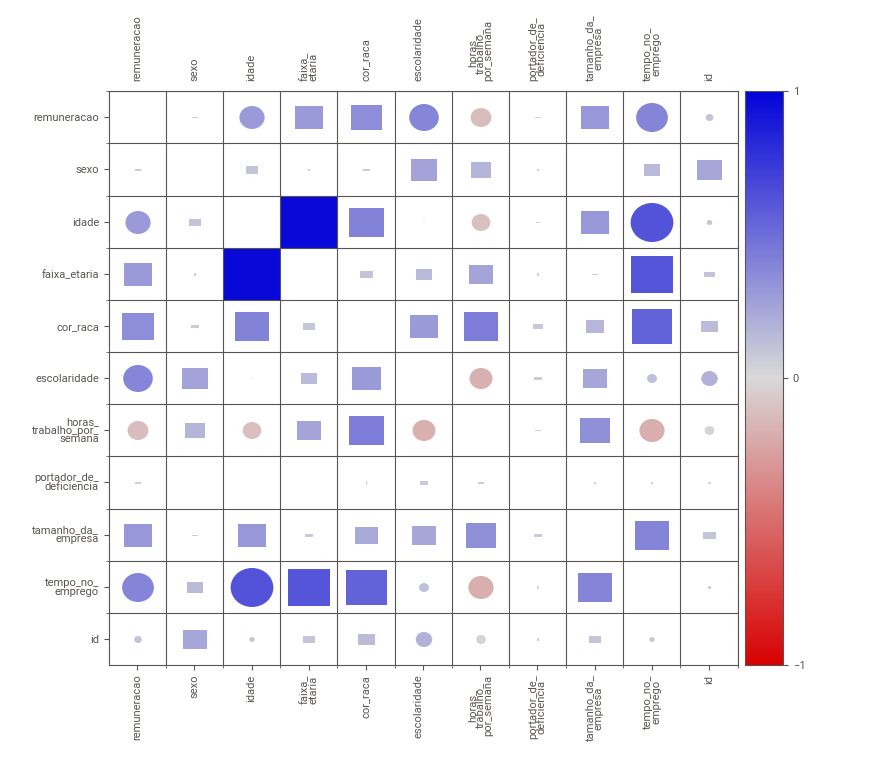
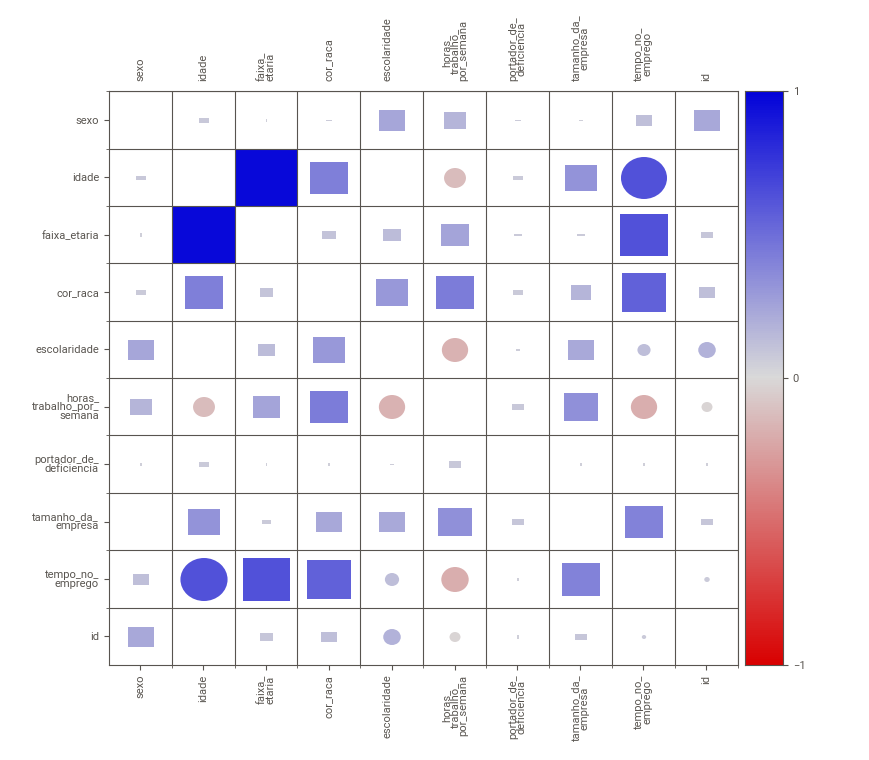

In [30]:
eda2.show_notebook()


In [31]:
# Comparing the train e test datasets: non-duplicated datasets
eda3 = sv.compare([df_train_nao_dup, "Training Data"], [df_test_nao_dup, "Test Data"], "remuneracao")

                                             |                                             | [  0%]   00:00 ->…

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)



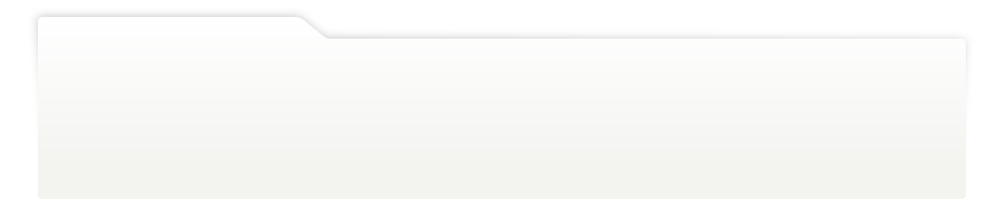
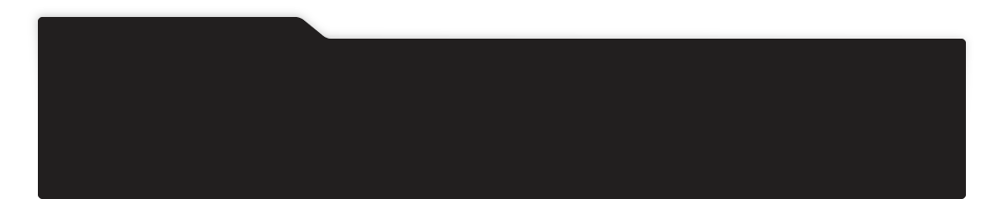
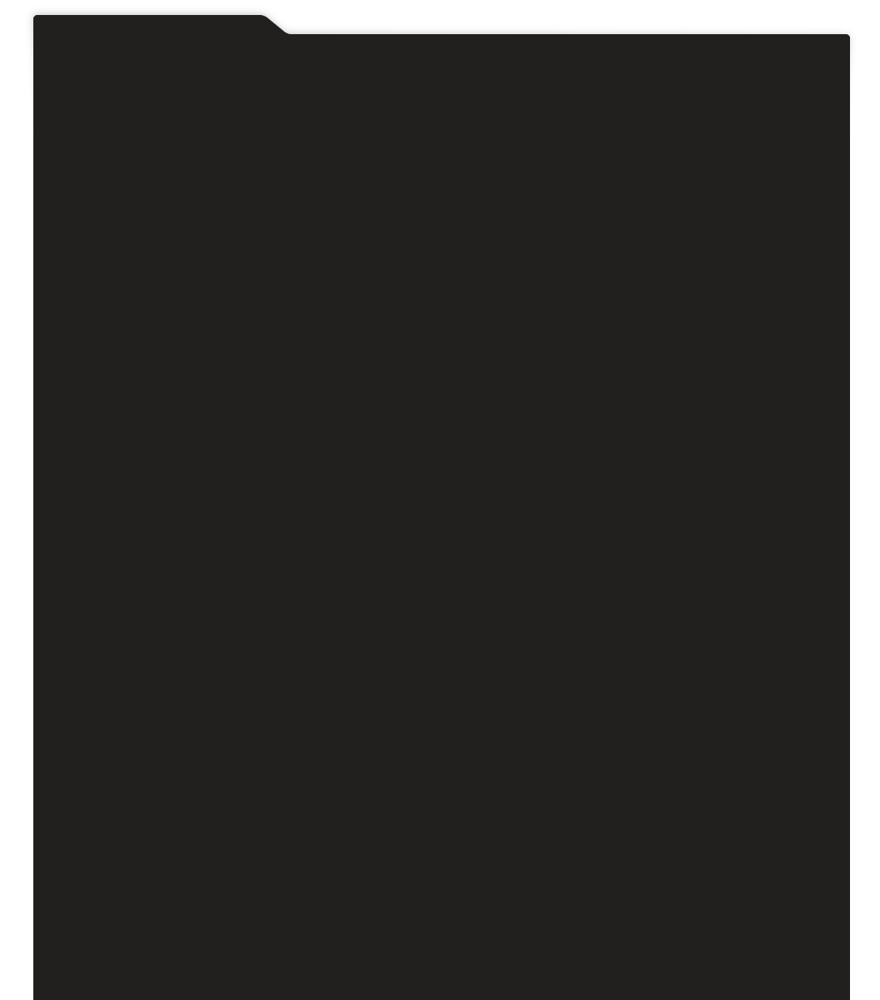
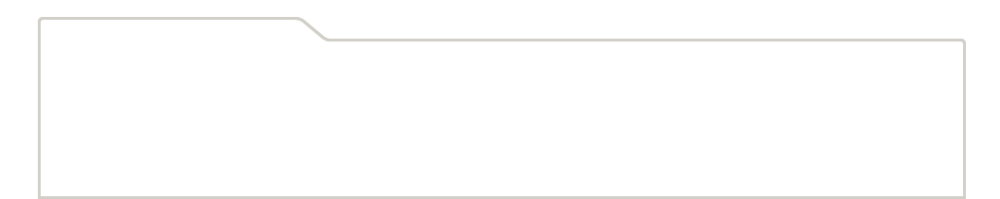
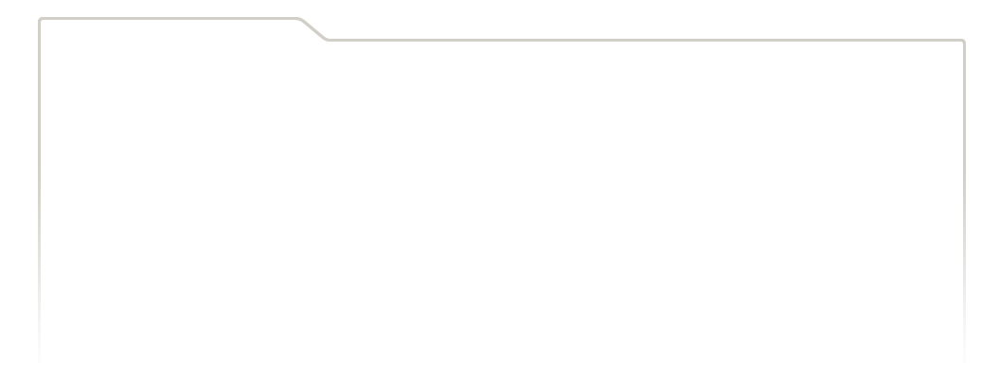
...
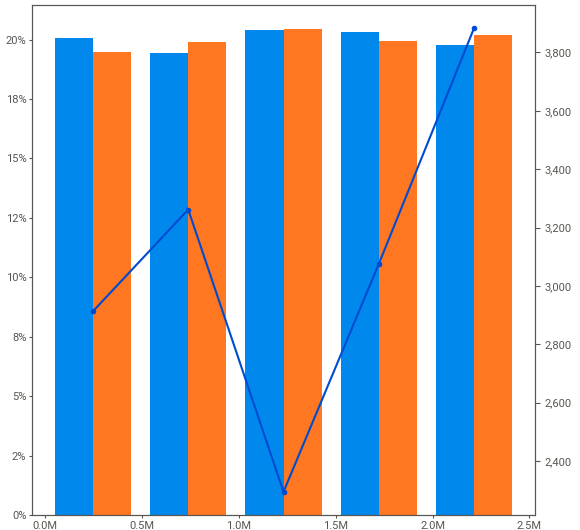
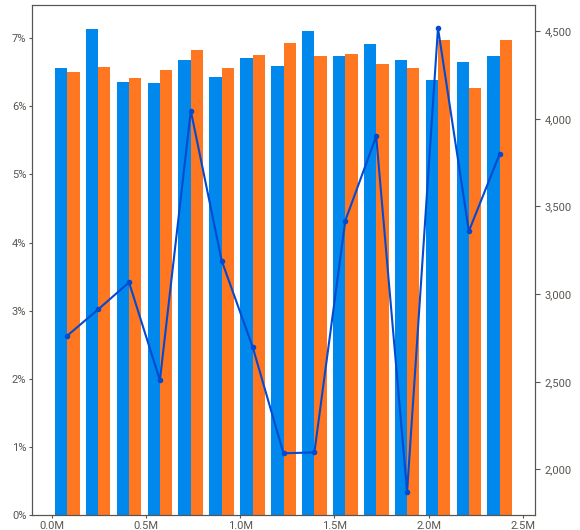
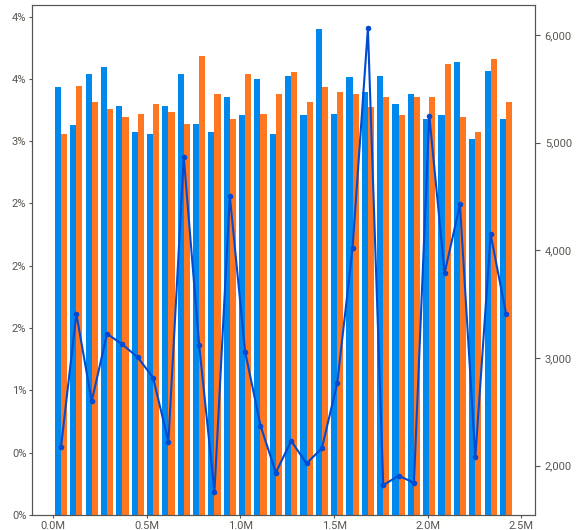
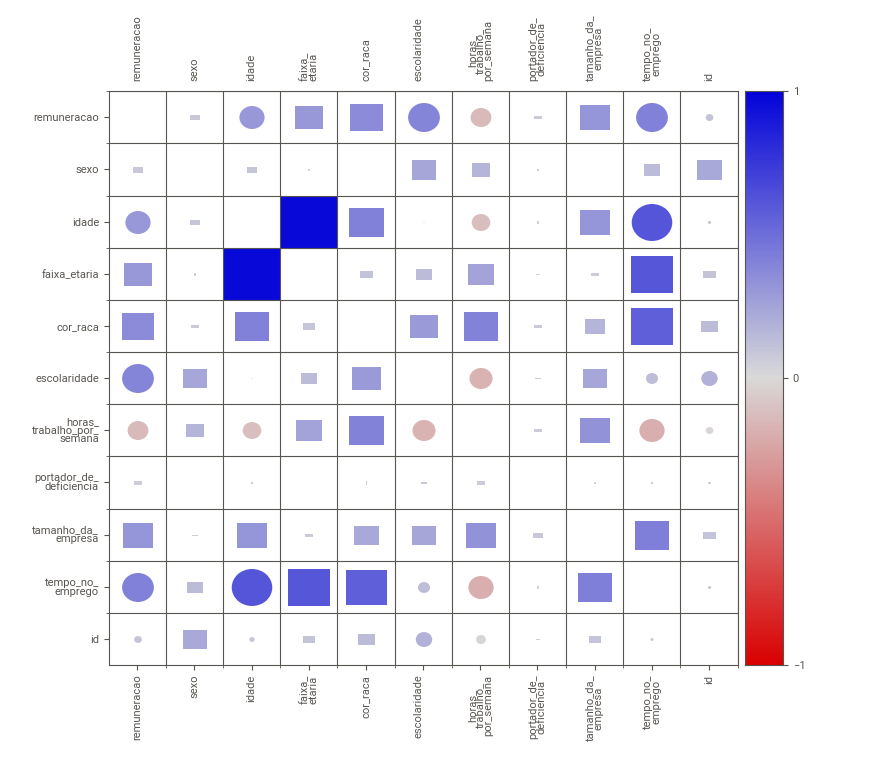
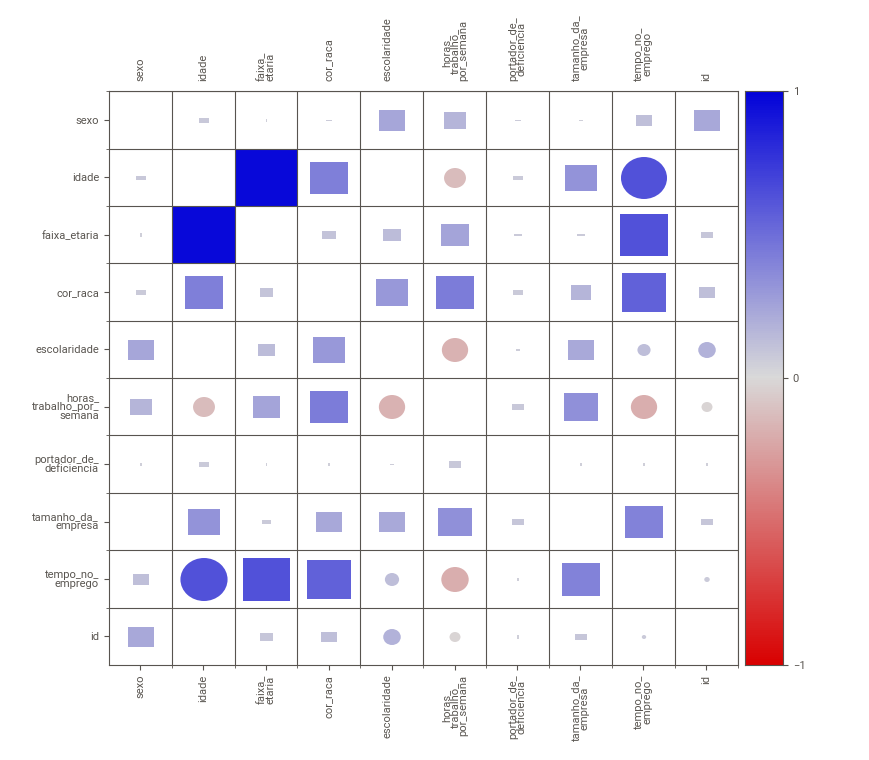

In [32]:
eda3.show_notebook()


***
- Conforme esperado, percebe-se uma alta correlação entre idade e faixa etária
- existe tb uma média/alta correlação destas com o tempo no emprego
- Já a variável resposta remuneração não possui uma boa correlação com nenhuma das variáveis
- Entretanto, não existe correlação da idade/faixa_etaria com a escolaridade

<AxesSubplot:>

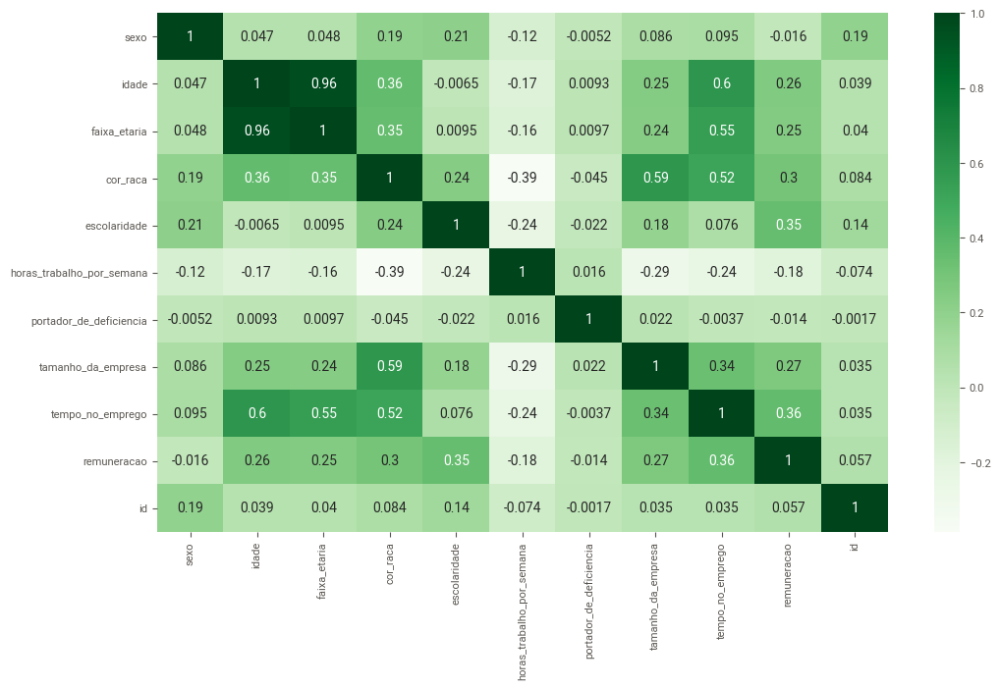

In [50]:
plt.figure(figsize=(12, 7))
sns.heatmap(df_train.corr(), annot=True, cmap='Greens')

Visualmente não consegue-se perceber pelo pairplot uma curva (equação) que consiga descrever o relacionamento inter variáveis
(como cada variável se relaciona com outra), visto que os pontos estão bem dispersos

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<Figure size 1500x3000 with 0 Axes>

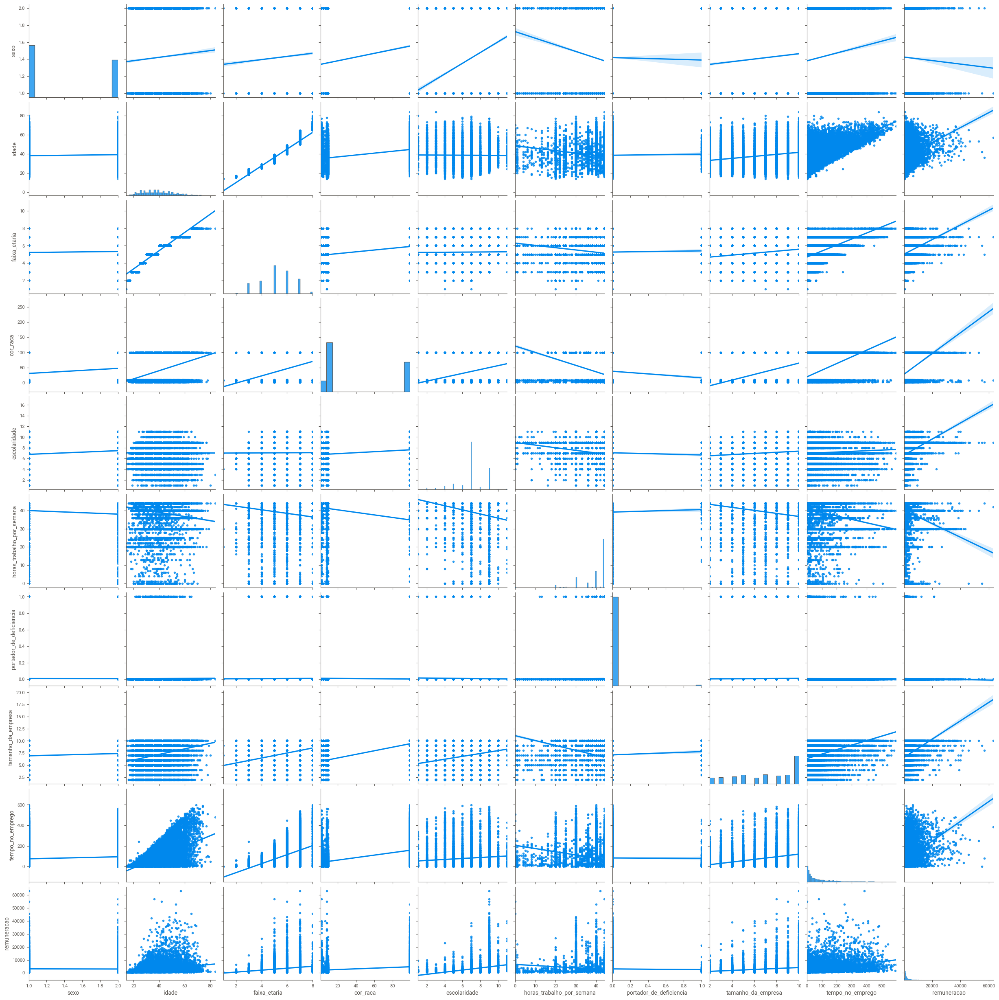

In [54]:

sns.pairplot(df_train.drop(columns =['id'],axis = 1),
             kind = 'reg')

***

# <font color=green> Avaliando as variáveis individualmente</font>

## 1º Variaveis continuas


    

### 1. Variável remuneracao

A variável remuneracao apresenta uma distribuição que se assemelha a uma exponencial. Normalmente, uma variável que se distribui formando uma gaussiana é melhor para os modelos de previsão. Dessa forma, esta foi logaritimizada para se aproximar de uma curva normal, o que melhorou as correlaçoes.

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='remuneracao', ylabel='Density'>

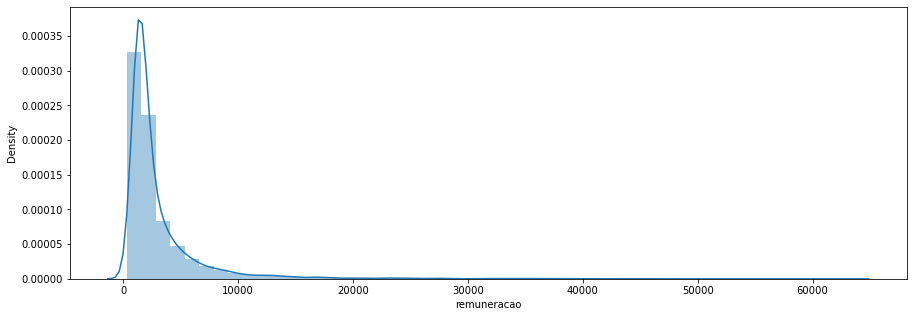

In [10]:
plt.figure(figsize=(15, 5))
sns.distplot(df_train.remuneracao, hist=True)

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


Text(0.5, 1.0, 'Remuneração')

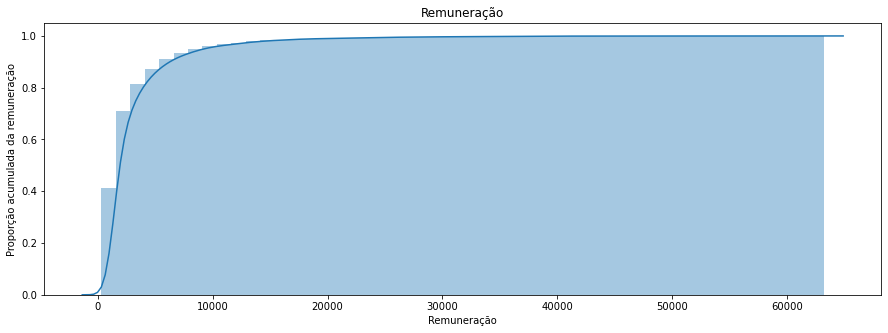

In [13]:
plt.figure(figsize=(15, 5))
ax = sns.distplot(df_train.remuneracao, 
                  hist_kws = {'cumulative':True}, 
                  kde_kws = {'cumulative':True})
ax.set(xlabel='Remuneração', ylabel='Proporção acumulada da remuneração')
ax.set_title('Remuneração')

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='remuneracao'>

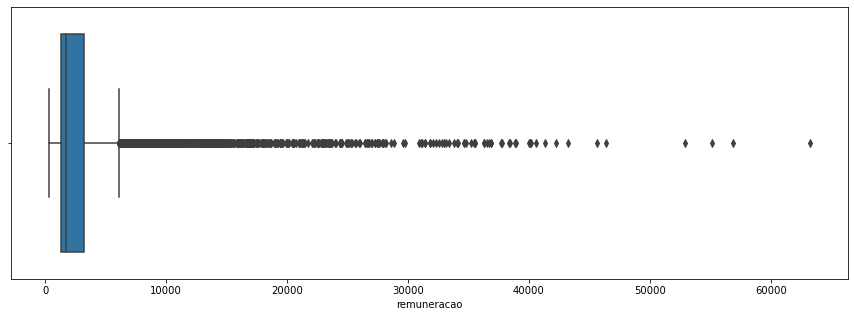

In [17]:
plt.figure(figsize=(15, 5))
sns.boxplot(df_train.remuneracao)

Tornando a variável resposta mais próxima à distribuição normal

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='remuneracao_log', ylabel='Density'>

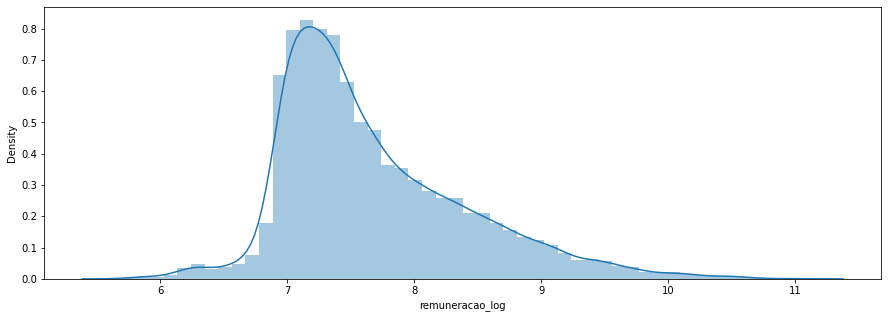

In [14]:
# Natural logarithm
df_train['remuneracao_log'] = np.log(df_train.remuneracao)

plt.figure(figsize=(15, 5))
sns.distplot(df_train.remuneracao_log, hist=True)

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


Text(0.5, 1.0, 'log - Remuneração')

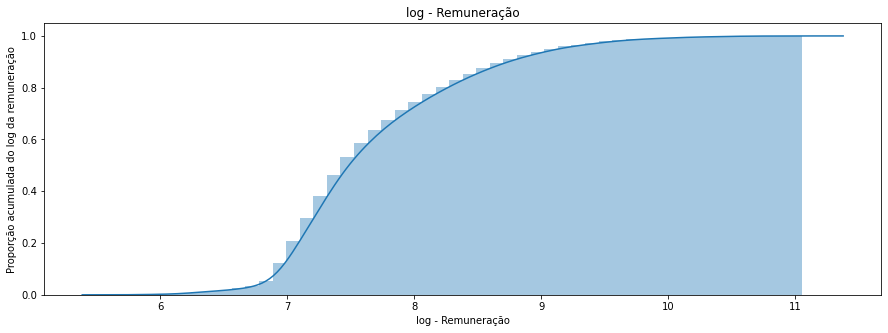

In [16]:
plt.figure(figsize=(15, 5))
ax = sns.distplot(df_train.remuneracao_log, 
                  hist_kws = {'cumulative':True}, 
                  kde_kws = {'cumulative':True})
ax.set(xlabel='log - Remuneração', ylabel='Proporção acumulada do log da remuneração')
ax.set_title('log - Remuneração')

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='remuneracao_log'>

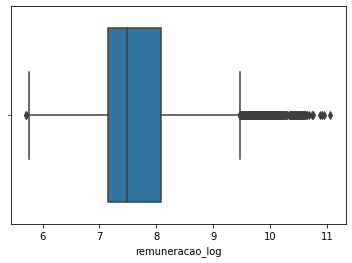

In [15]:
sns.boxplot(df_train.remuneracao_log)

In [38]:
eda4 = sv.compare([df_train, "Training Data"], [df_test, "Test Data"], "remuneracao_log")

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


                                             |                                             | [  0%]   00:00 ->…

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)



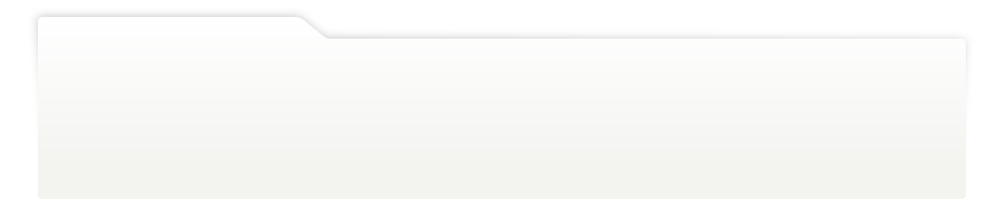
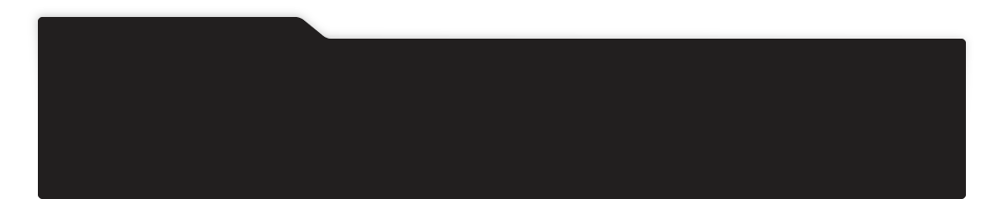
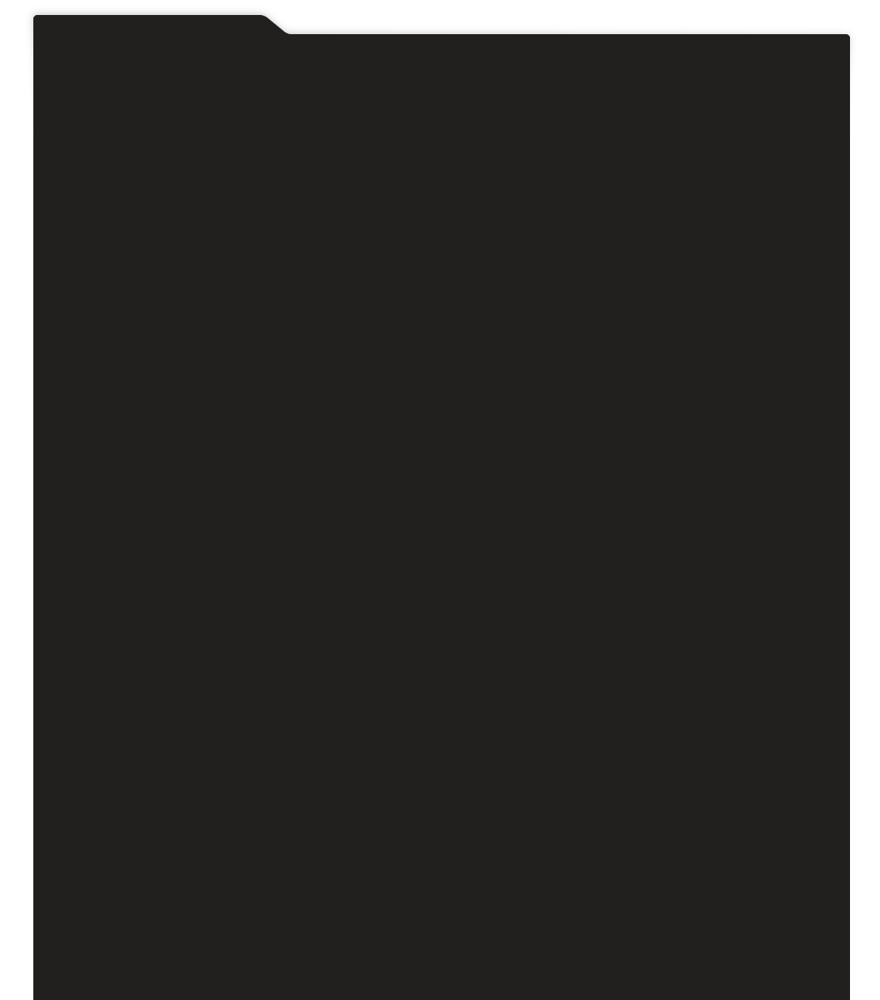
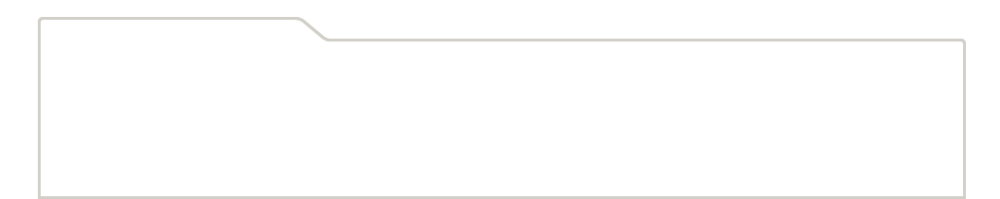
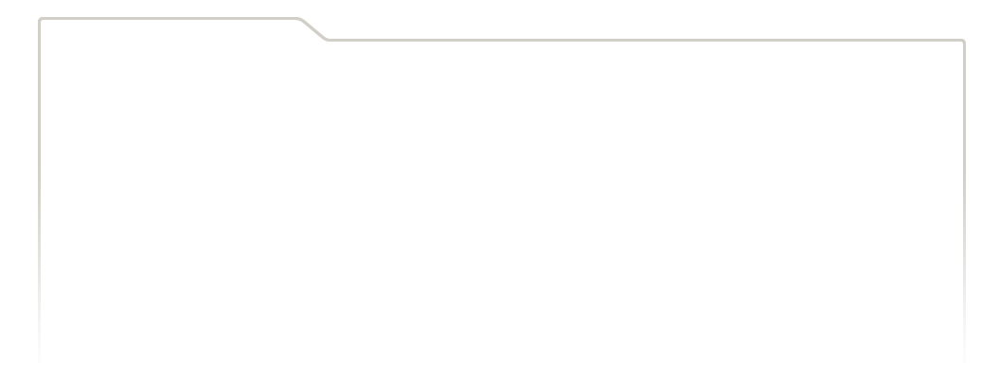
...
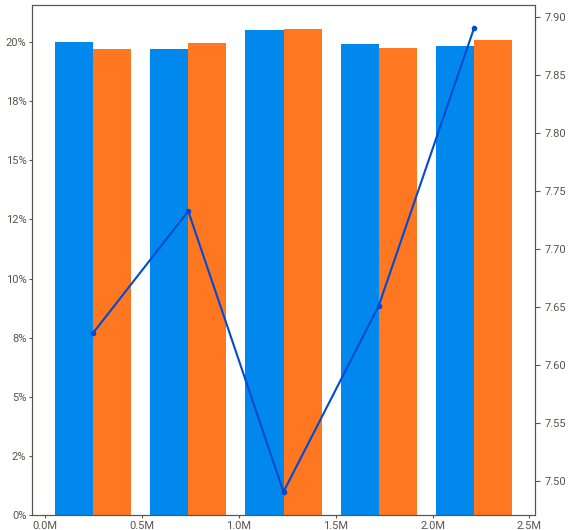
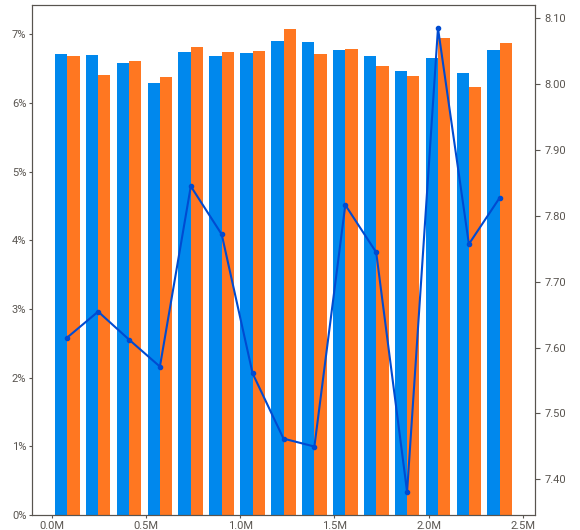
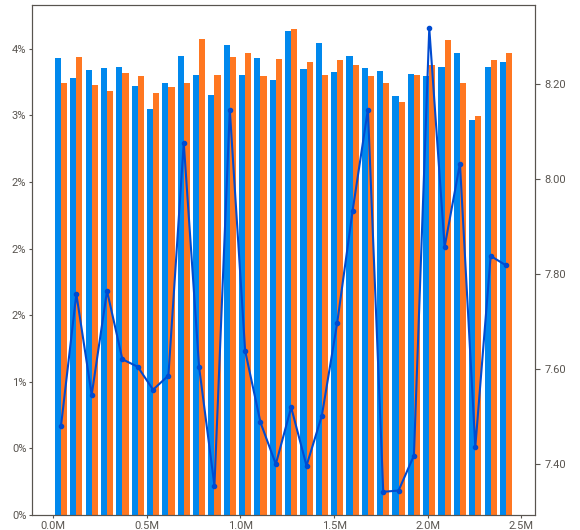
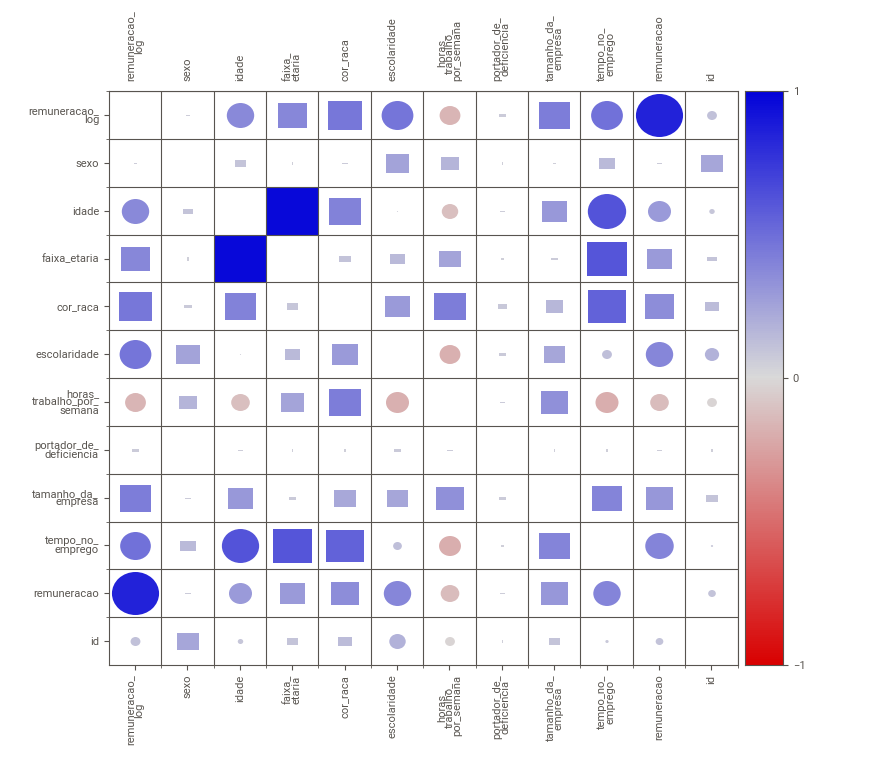
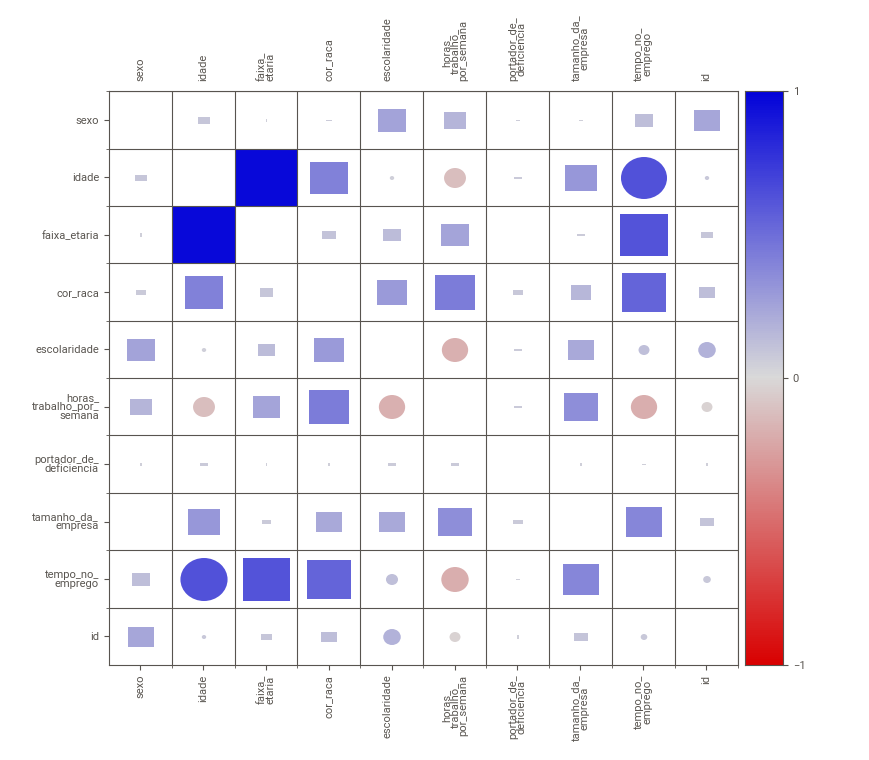

In [39]:
eda4.show_notebook()

#### A matriz de correlação abaixo indica um aumento da correlação da variável resposta com as outras quando aquela é logaritimizada

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<AxesSubplot:>

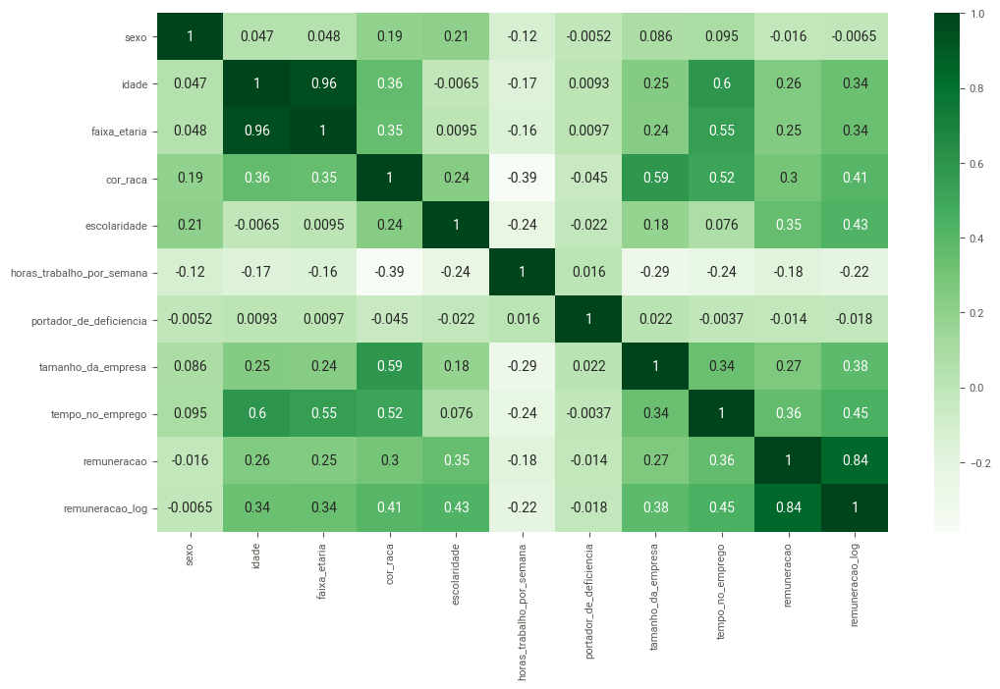

In [57]:
plt.figure(figsize=(12, 7))
sns.heatmap(df_train.drop(columns=['id'], axis=1).corr(), annot=True, cmap='Greens')

Observa-se uma leve diferença quando a variável sexo é masculino ou feminino, especialmente quando as variáveis escolaridade e tempo no emprego são analisadas. 

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


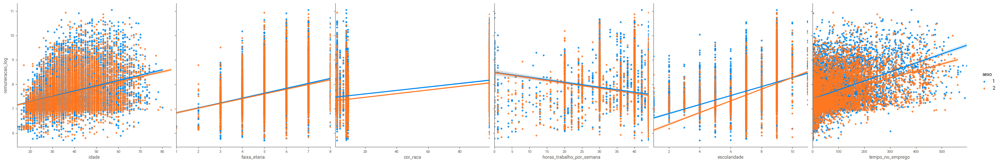

In [71]:

sns.pairplot(df_train.drop(columns =['id', 'remuneracao', 'portador_de_deficiencia'],axis = 1),
             x_vars = ['idade', 'faixa_etaria', 'cor_raca', 'horas_trabalho_por_semana', 'escolaridade', 'tempo_no_emprego'],
             y_vars = ['remuneracao_log'], 
             hue = 'sexo',
             kind = 'reg',
             height=5, aspect=1)

### 2. Variável tempo no emprego


A variável tempo no emprego também parece se aproximar de uma distribuição exponencial. 
Esta variável parece apresentar uma tendência de aumento com o log da remuneracao (correlação).
Avaliando seu boxplot, observa-se um número considerável de outliers, o que era esperado visto sua distribuição.


C:\ProgramData\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='tempo_no_emprego', ylabel='Density'>

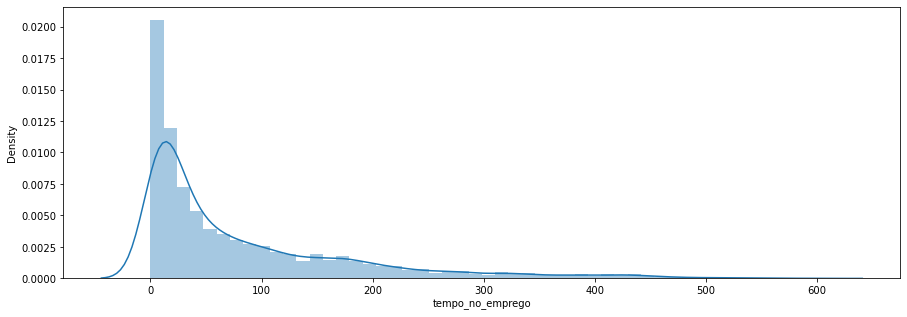

In [18]:
plt.figure(figsize=(15, 5))
sns.distplot(df_train.tempo_no_emprego, hist=True)

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


Text(0.5, 1.0, 'Tempo no emprego')

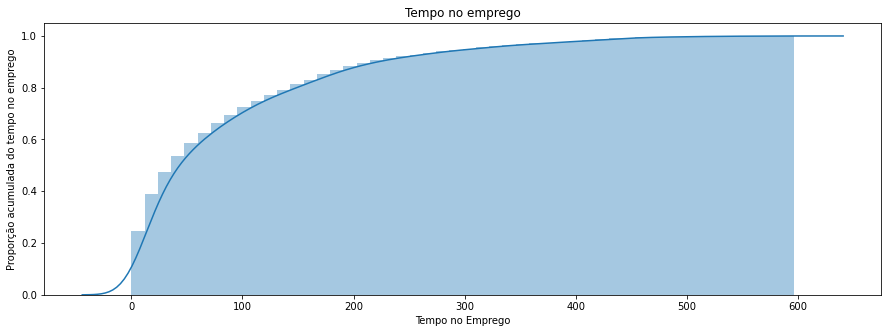

In [19]:
plt.figure(figsize=(15, 5))
ax = sns.distplot(df_train.tempo_no_emprego, 
                  hist_kws = {'cumulative':True}, 
                  kde_kws = {'cumulative':True})
ax.set(xlabel='Tempo no Emprego', ylabel='Proporção acumulada do tempo no emprego')
ax.set_title('Tempo no emprego')

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='tempo_no_emprego'>

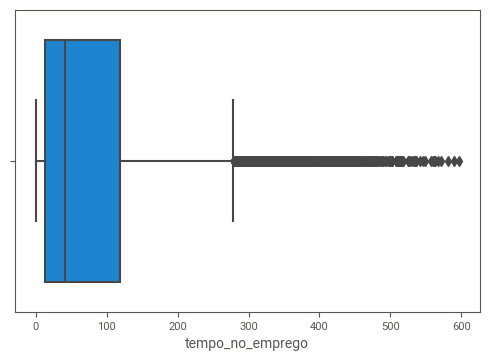

In [82]:
sns.boxplot(df_train.tempo_no_emprego)

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<AxesSubplot:xlabel='tempo_no_emprego'>

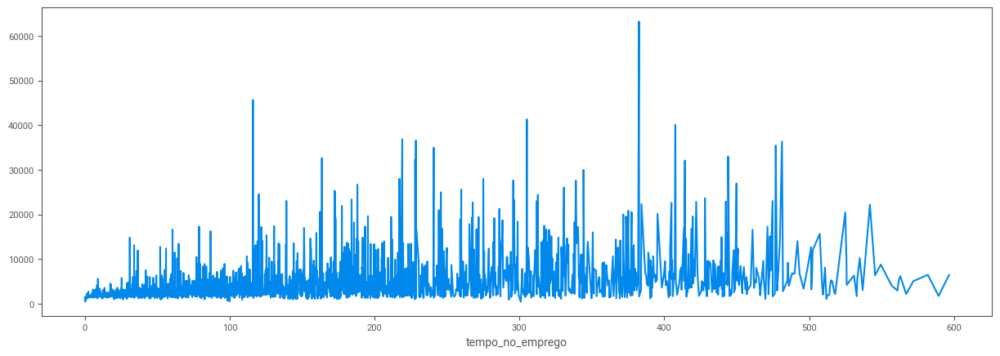

In [73]:
plt.figure(figsize=(15, 5))
df_train.groupby('tempo_no_emprego')['remuneracao'].mean().plot(kind='line')

In [46]:
top_tempo_emprego = df_train['tempo_no_emprego'].quantile(0.975)
top_tempo_emprego

386.8

In [45]:
df_train.tempo_no_emprego.describe()

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


count    15000.000000
mean        83.200600
std        100.756705
min          0.000000
25%         12.700000
50%         40.700000
75%        118.900000
max        596.500000
Name: tempo_no_emprego, dtype: float64

<AxesSubplot:xlabel='tempo_no_emprego', ylabel='remuneracao_log'>

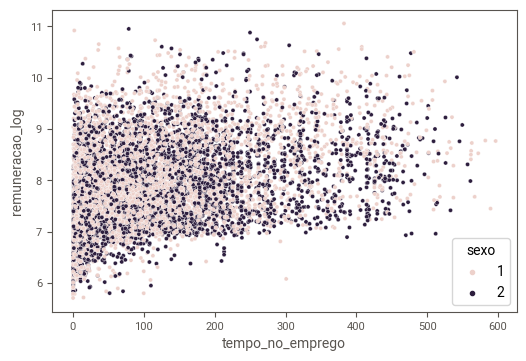

In [90]:

sns.scatterplot(data=df_train, 
                x = 'tempo_no_emprego',
                y = 'remuneracao_log', 
                hue = 'sexo',
                             )

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<AxesSubplot:xlabel='tempo_no_emprego', ylabel='remuneracao_log'>

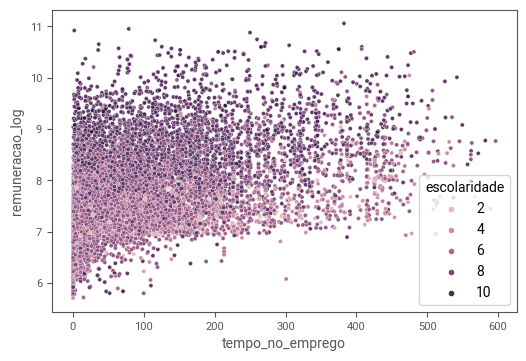

In [91]:
sns.scatterplot(data=df_train, 
                x = 'tempo_no_emprego',
                y = 'remuneracao_log', 
                hue = 'escolaridade',
                             )

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<AxesSubplot:xlabel='tempo_no_emprego', ylabel='remuneracao_log'>

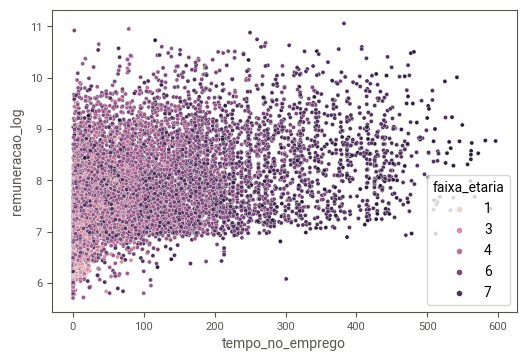

In [95]:
sns.scatterplot(data=df_train, 
                x = 'tempo_no_emprego',
                y = 'remuneracao_log', 
                hue = 'faixa_etaria',
                             )

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


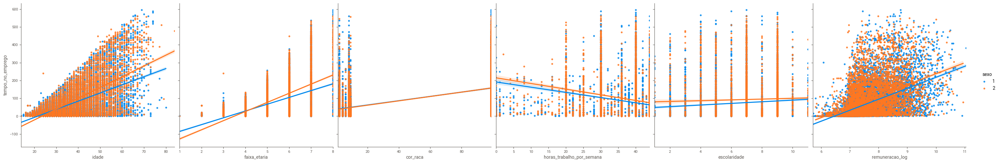

In [159]:

sns.pairplot(df_train.drop(columns =['id', 'remuneracao', 'portador_de_deficiencia'],axis = 1),
             x_vars = ['idade', 'faixa_etaria', 'cor_raca', 'horas_trabalho_por_semana', 'escolaridade', 'remuneracao_log'],
             y_vars = ['tempo_no_emprego'], 
             hue = 'sexo',
             kind = 'reg',
             height=5, aspect=1)

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


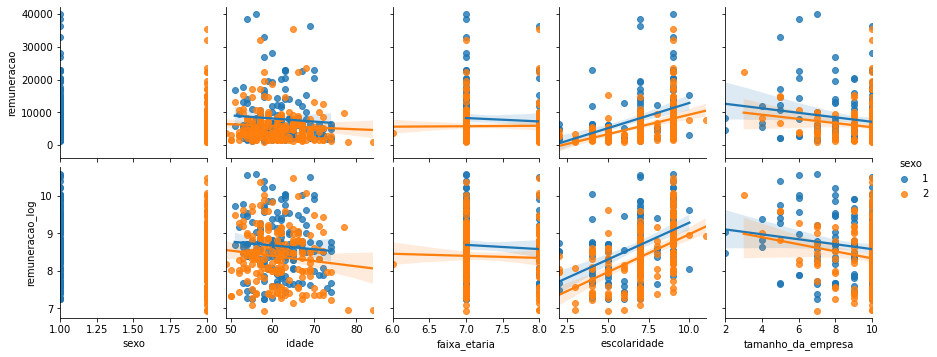

In [23]:
top_tempo_emprego = df_train['tempo_no_emprego'].quantile(0.975)
sns.pairplot(df_train[df_train.tempo_no_emprego > top_tempo_emprego], 
            x_vars=['sexo', 'idade', 'faixa_etaria', 'escolaridade',
                    'tamanho_da_empresa'], 
            y_vars = ['remuneracao', 'remuneracao_log'],
             hue = 'sexo',
            kind = 'reg')

### 3. Variável horas de trabalho por semana

Aparentemente a variável horas d etrabalho por semana não apresenta uma sequência lógica. O esperado seria quanto mais horas, maior o salário, porém, não é o caso. Observa-se também uma grande quantidade considerável de pessoas com horas de trabalho igual a zero. Isso possivelmente se deve a ser um trabalho pago por serviço (e não por hora) ou um dado faltante que foi completado com o valor zero. Além disso, apesar de se tratar de uma variável numérica discreta, esta pode ser agrupada e tratada como categórica.

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<AxesSubplot:xlabel='horas_trabalho_por_semana', ylabel='horas_trabalho_por_semana'>

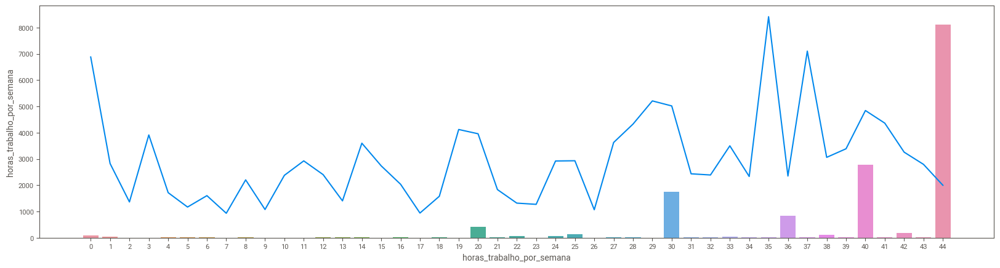

In [104]:
plt.figure(figsize=(20, 5))
sns.barplot(x=df_train.horas_trabalho_por_semana.value_counts().index, y=df_train.horas_trabalho_por_semana.value_counts())
df_train.groupby('horas_trabalho_por_semana')['remuneracao'].mean().plot(kind='line')

Possível agrupamento:
1. [2,5,7,9,17,26]
2. [4,6,13,18,21,22,23]
3. [8,10,12,16,31,32,34,36,44]
4. [1,11,15,24,25,38,43]
5. [3,14,19,20,27,28,33,39,42]
6. [29,30,40,41]
7. [0,37]
8. Outros


C:\ProgramData\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<AxesSubplot:xlabel='horas_trabalho_por_semana', ylabel='remuneracao'>

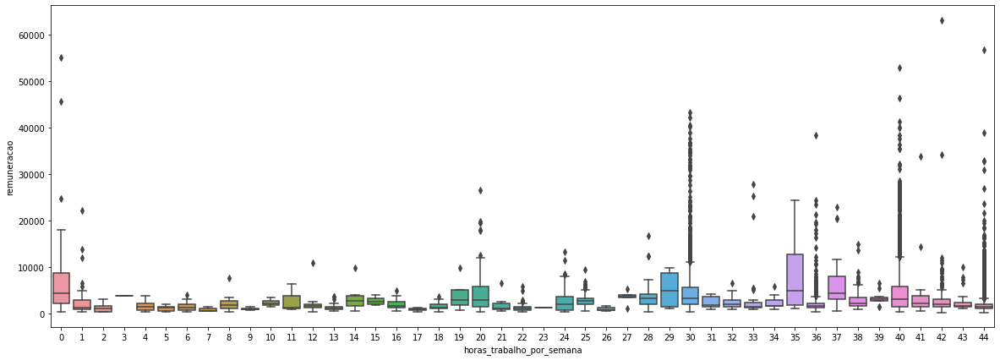

In [54]:
plt.figure(figsize=(20, 7))
sns.boxplot(x = 'horas_trabalho_por_semana', y ='remuneracao', data=df_train)

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<AxesSubplot:xlabel='horas_trabalho_por_semana', ylabel='remuneracao_log'>

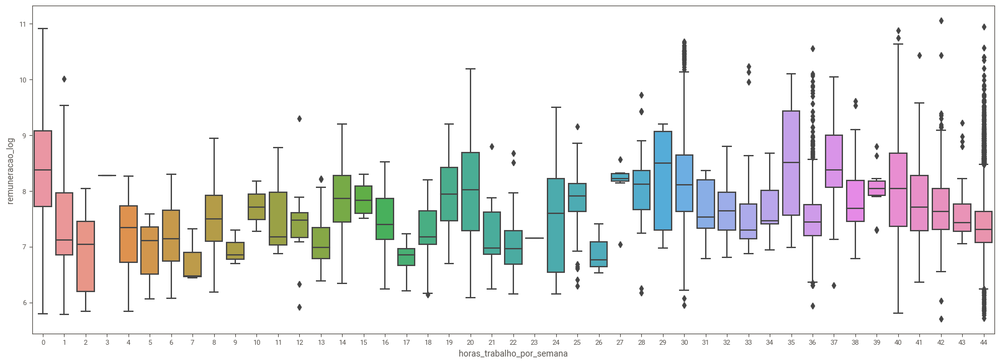

In [116]:
plt.figure(figsize=(20, 7))
sns.boxplot(x = 'horas_trabalho_por_semana', y ='remuneracao_log', data=df_train)

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='horas_trabalho_por_semana'>

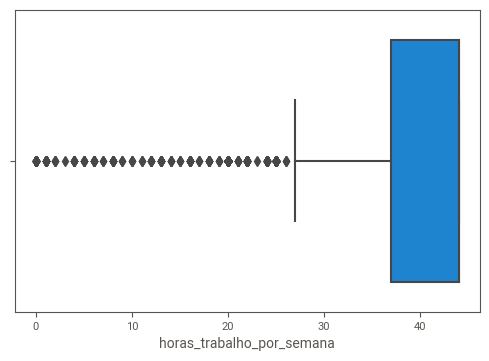

In [105]:
sns.boxplot(df_train.horas_trabalho_por_semana)

### Observando a variável horas de trabalho por semana quando esta é igual a zero

Nota-se 89 dados com horas de trabalho igual a zero. Percebe-se ainda que a escolaridade desse grupo varia de 4 a 10 e a cor_raca não apresenta nenhum dado ignorado (=99). Por se tratar de um número 'pequeno' de dados, deve-se analisar se vale a pena a inclusão de outra coluna para quando este for zero, visto que sua remuneração destoa das demais.

In [107]:
df_train[df_train.horas_trabalho_por_semana == 0].describe()

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,sexo,idade,faixa_etaria,cor_raca,escolaridade,horas_trabalho_por_semana,portador_de_deficiencia,tamanho_da_empresa,tempo_no_emprego,remuneracao,id,remuneracao_log
count,89.000000,89.000000,89.000000,89.000000,89.000000,89.0,89.0,89.000000,89.000000,89.000000,8.900000e+01,89.000000
mean,1.202247,39.865169,5.460674,6.505618,7.516854,0.0,0.0,6.539326,70.002247,6880.755056,1.293801e+06,8.336231
std,0.403951,11.284735,1.261818,2.693104,1.280202,0.0,0.0,2.056344,90.569704,8397.843506,7.140072e+05,1.018673
min,1.000000,20.000000,3.000000,2.000000,4.000000,0.0,0.0,2.000000,0.200000,327.040000,4.247000e+04,5.790082
25%,1.000000,33.000000,5.000000,4.000000,7.000000,0.0,0.0,5.000000,10.500000,2246.040000,7.322480e+05,7.716924
50%,1.000000,39.000000,5.000000,8.000000,7.000000,0.0,0.0,7.000000,37.300000,4362.460000,1.322166e+06,8.380791
75%,1.000000,48.000000,6.000000,8.000000,9.000000,0.0,0.0,8.000000,99.600000,8772.170000,1.870602e+06,9.079339
max,2.000000,70.000000,8.000000,9.000000,10.000000,0.0,0.0,10.000000,507.300000,55122.470000,2.417067e+06,10.917313


## 2º Variáveis categóricas

### 4. Faixa_etaria

Observa-se a presença de 2 linhas com faixa_etaria = 1 no dataset de treino, enquanto que no de teste não existem pessoas com essa idade.

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<AxesSubplot:xlabel='faixa_etaria', ylabel='faixa_etaria'>

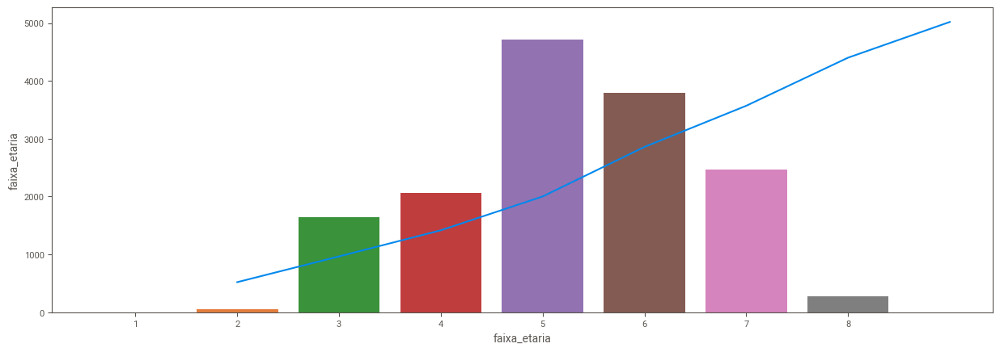

In [163]:
plt.figure(figsize=(15, 5))
sns.barplot(x=df_train.faixa_etaria.value_counts().index, y=df_train.faixa_etaria.value_counts())
df_train.groupby('faixa_etaria').remuneracao.mean().plot(kind='line')

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<AxesSubplot:xlabel='faixa_etaria', ylabel='remuneracao'>

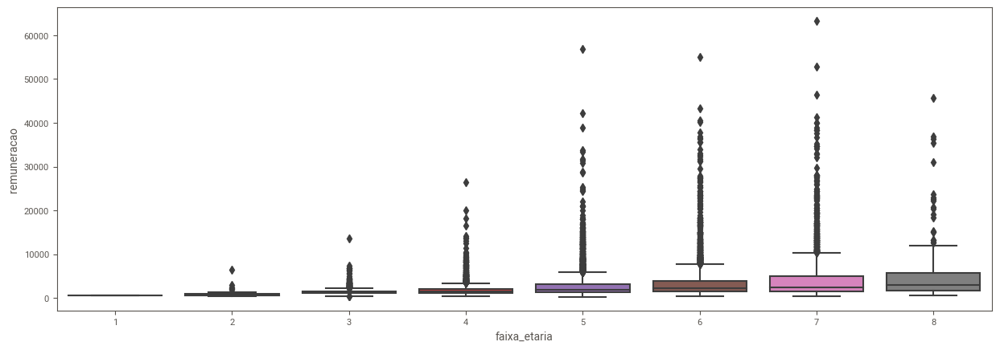

In [115]:
plt.figure(figsize=(15, 5))
sns.boxplot(x = 'faixa_etaria', y ='remuneracao', data=df_train)

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<AxesSubplot:xlabel='faixa_etaria', ylabel='remuneracao_log'>

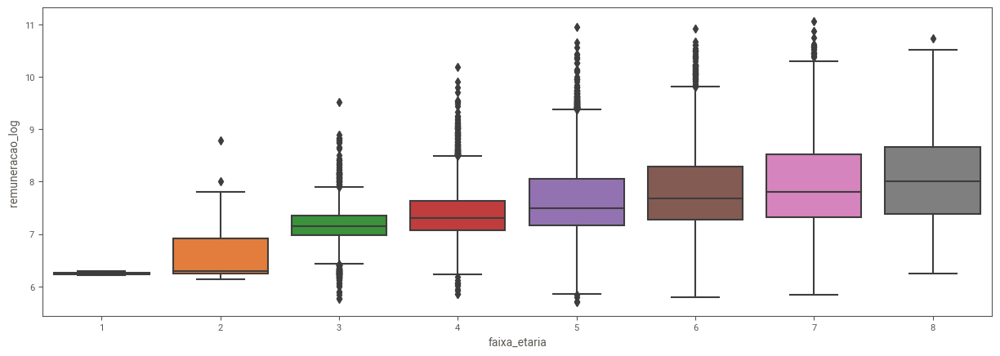

In [117]:
plt.figure(figsize=(15, 5))
sns.boxplot(x = 'faixa_etaria', y ='remuneracao_log', data=df_train)

### 5. tamanho da empresa

Esta variável aponta para uma correlação positiva com a variável remuneração.

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<AxesSubplot:xlabel='tamanho_da_empresa', ylabel='tamanho_da_empresa'>

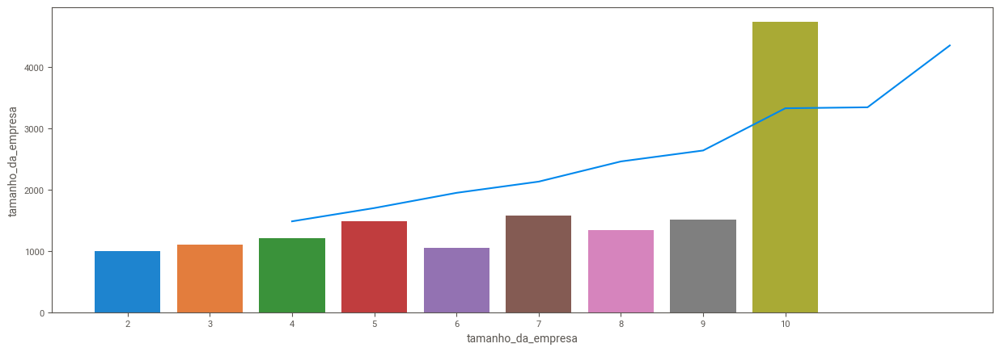

In [153]:
plt.figure(figsize=(15, 5))
sns.barplot(x=df_train.tamanho_da_empresa.value_counts().index, y=df_train.tamanho_da_empresa.value_counts())
df_train.groupby('tamanho_da_empresa').remuneracao.mean().plot(kind='line', figsize = (15,5))

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<AxesSubplot:xlabel='tamanho_da_empresa', ylabel='remuneracao'>

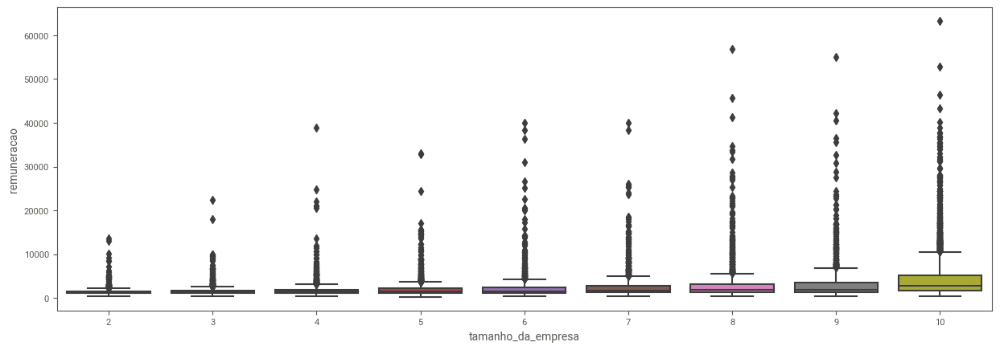

In [140]:
plt.figure(figsize=(15, 5))
sns.boxplot(x = 'tamanho_da_empresa', y ='remuneracao', data=df_train)

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<AxesSubplot:xlabel='tamanho_da_empresa', ylabel='remuneracao_log'>

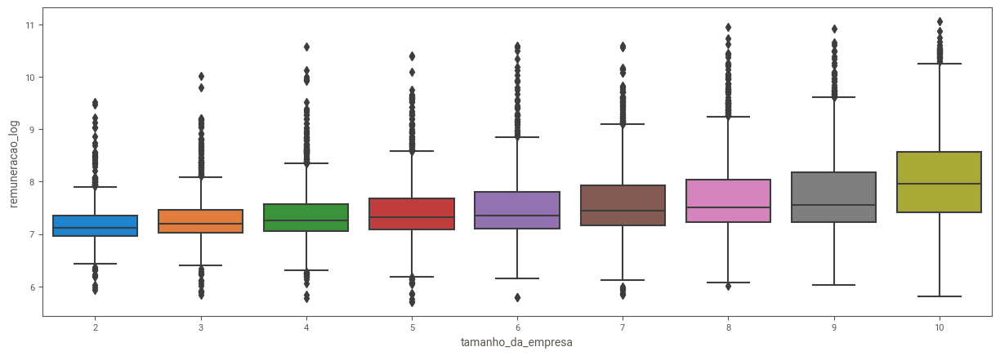

In [141]:
plt.figure(figsize=(15, 5))
sns.boxplot(x = 'tamanho_da_empresa', y ='remuneracao_log', data=df_train)

### Possíveis novas classificações

|Código|Descrição|Novo|
|---|---|---|
|2|Até 4|Micro|Nível 1|
|3|de 5 a 9|Micro|Nível 1|
|4|de 10 a 19|Micro|Nível 2|
|5|de 20 a 49|Pequena|Nível 2|
|6|de 50 a 99|Pequena|Nível 3|
|7|de 100 a 249|Média|Nível 3|
|8|de 250 a 499|Média|Nível 4|
|9|de 500 a 999|Grande|Nível 4|
|10|1000 ou mais|Grande|Nível 5|

### 6. cor raça

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<AxesSubplot:xlabel='cor_raca', ylabel='remuneracao'>

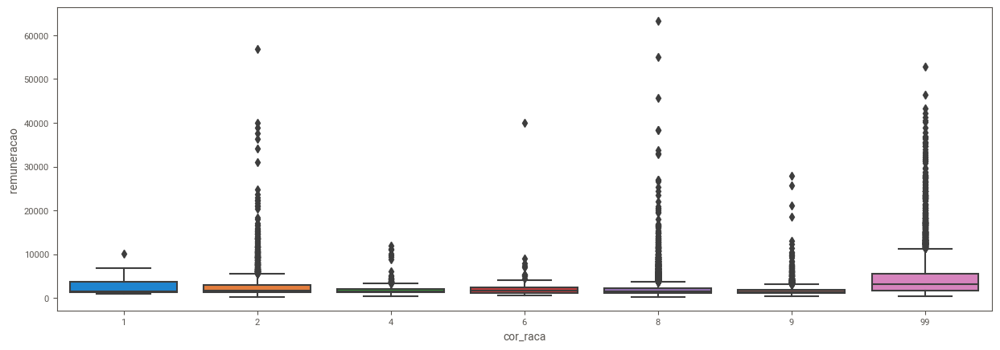

In [142]:
plt.figure(figsize=(15, 5))
sns.boxplot(x = 'cor_raca', y ='remuneracao', data=df_train)

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<AxesSubplot:xlabel='cor_raca', ylabel='remuneracao_log'>

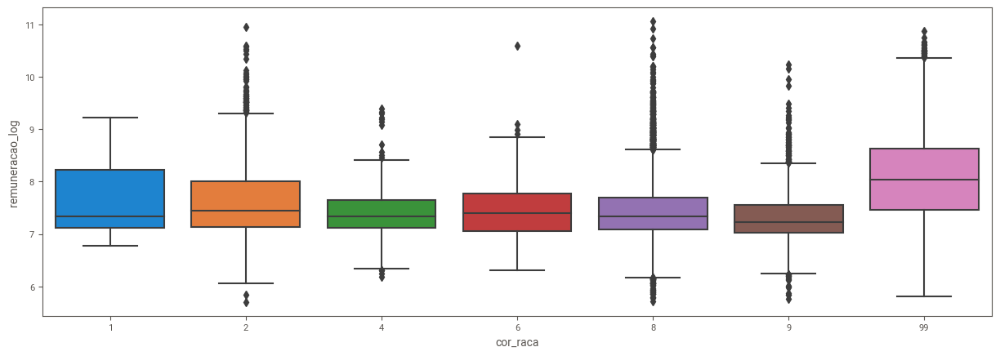

In [147]:
plt.figure(figsize=(15, 5))
sns.boxplot(x = 'cor_raca', y ='remuneracao_log', data=df_train)

In [145]:
#anova
pd.DataFrame(stats.f_oneway(df_train.loc[df_train.cor_raca==6], 
                            df_train.loc[df_train.cor_raca==2])[1], 
             index = df_train.columns, columns = ['Cor: 6 X 2'])

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\stats\stats.py:3709: F_onewayConstantInputWarning: Each of the input arrays is constant;the F statistic is not defined or infinite
  warnings.warn(F_onewayConstantInputWarning())


,Cor: 6 X 2
sexo,0.334327
idade,0.289476
faixa_etaria,0.447276
cor_raca,0.000000
escolaridade,0.050161
horas_trabalho_por_semana,0.628868
portador_de_deficiencia,0.362649
tamanho_da_empresa,0.336634
tempo_no_emprego,0.853942
remuneracao,0.535049


Pelo teste abaixo, o teste Wilcoxon apresentou um p-value de zero indicando que deve-se descatar Ho (a hipótese nula é de que as duas amostras vieram da mesma distribuição), ou seja, o teste concluiu que os valores de uma amostra têm uma tendência a serem maiores que os da outra amostra. Entretanto, quando se analisa somente a remuneração, o teste indica uma tendência à igualdade das amostras

In [39]:
from scipy.stats import ranksums

ranksums(df_train.loc[df_train.cor_raca==6], df_train.loc[df_train.cor_raca==2])

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


RanksumsResult(statistic=175.54848766239533, pvalue=0.0)

In [42]:
ranksums(df_train.loc[df_train.cor_raca==6].remuneracao, df_train.loc[df_train.cor_raca==2].remuneracao)

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


RanksumsResult(statistic=-1.663295711237404, pvalue=0.09625325679317417)

In [41]:
ranksums(df_train.loc[df_train.cor_raca==6].drop(columns = ['id', 'cor_raca'], axis=1), df_train.loc[df_train.cor_raca==2].drop(columns = ['id', 'cor_raca'], axis=1))

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


RanksumsResult(statistic=139.74570033411894, pvalue=0.0)

In [164]:
eda_cor = sv.compare([df_train.loc[df_train.cor_raca==6], "Cor 6"], [df_train.loc[df_train.cor_raca==2], "Cor 2"], "remuneracao")

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


                                             |                                             | [  0%]   00:00 ->…

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)



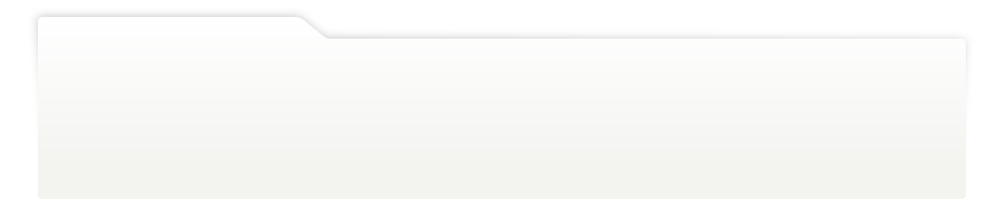
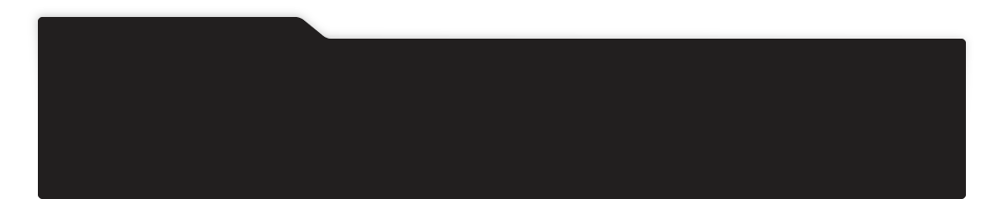
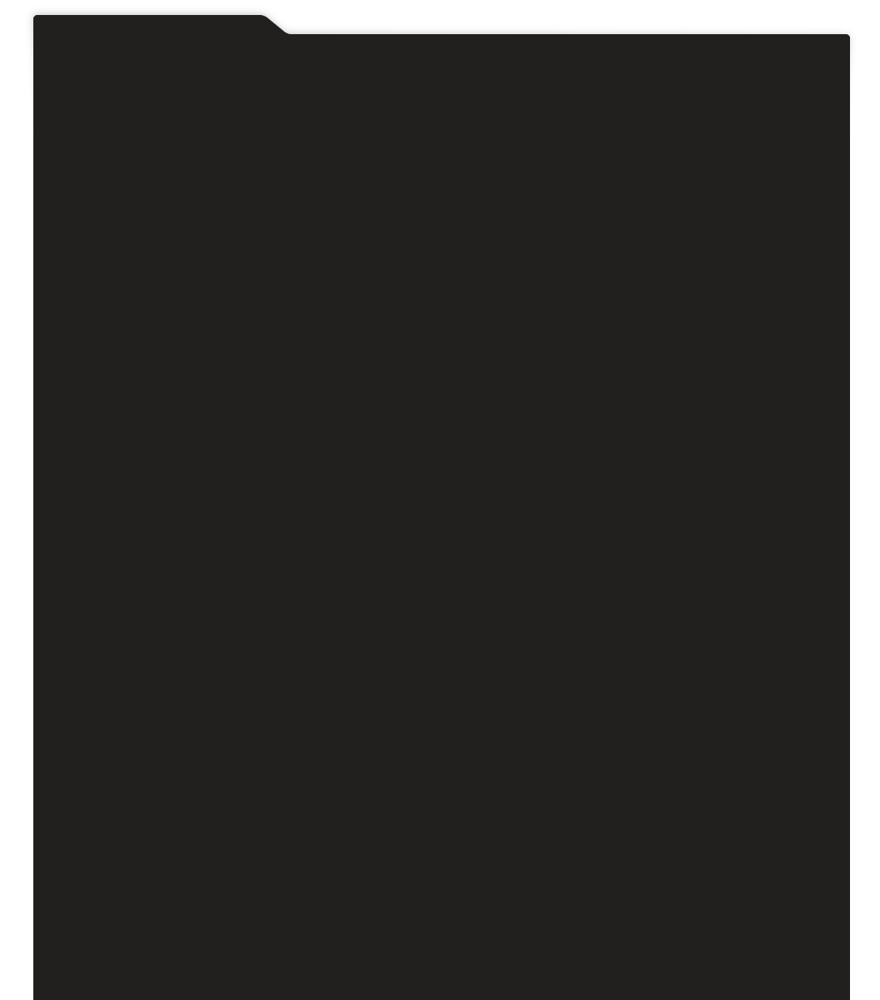
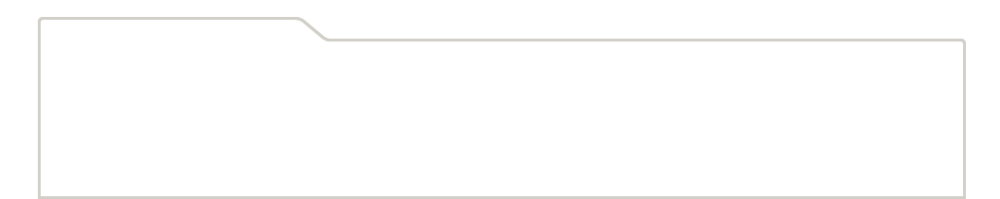
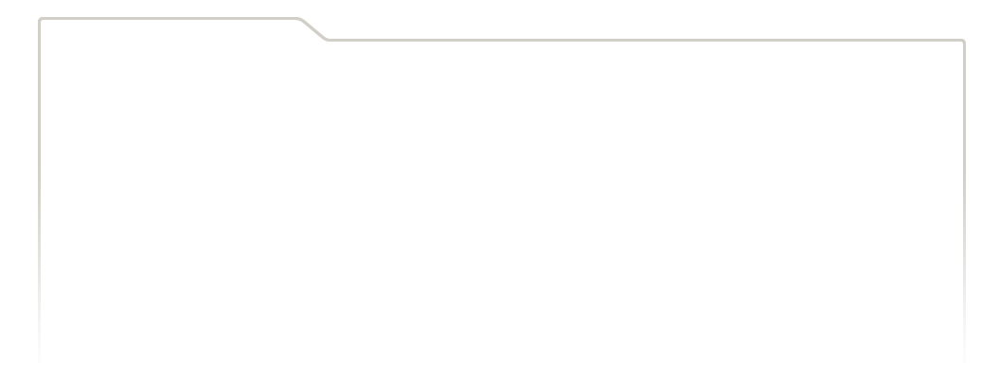
...
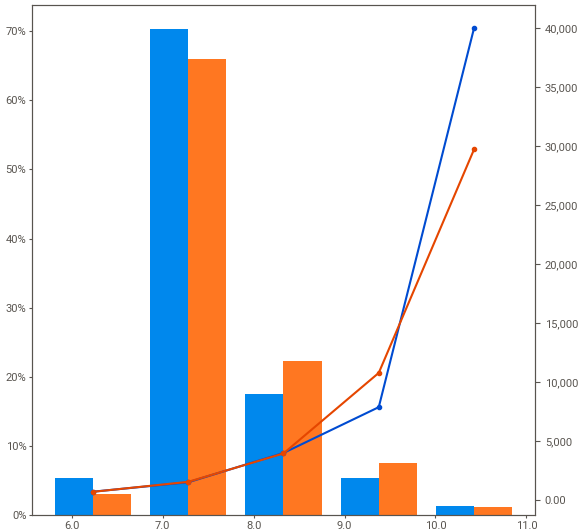
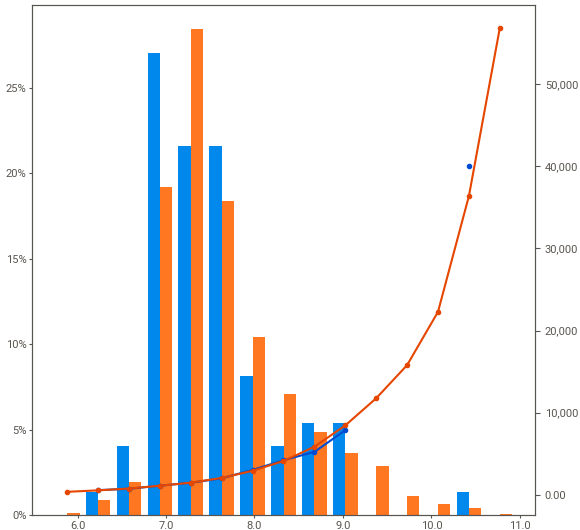
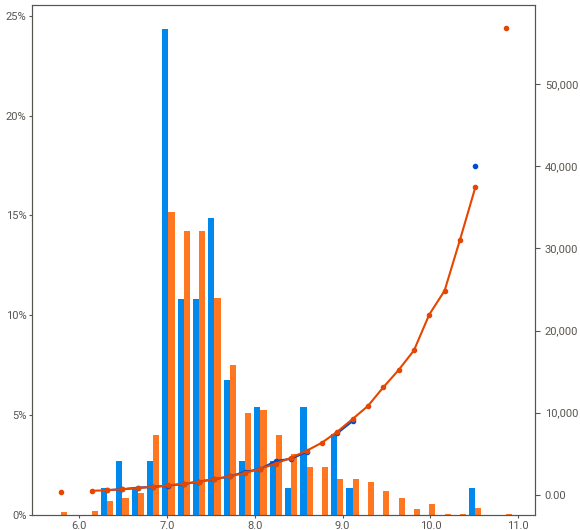
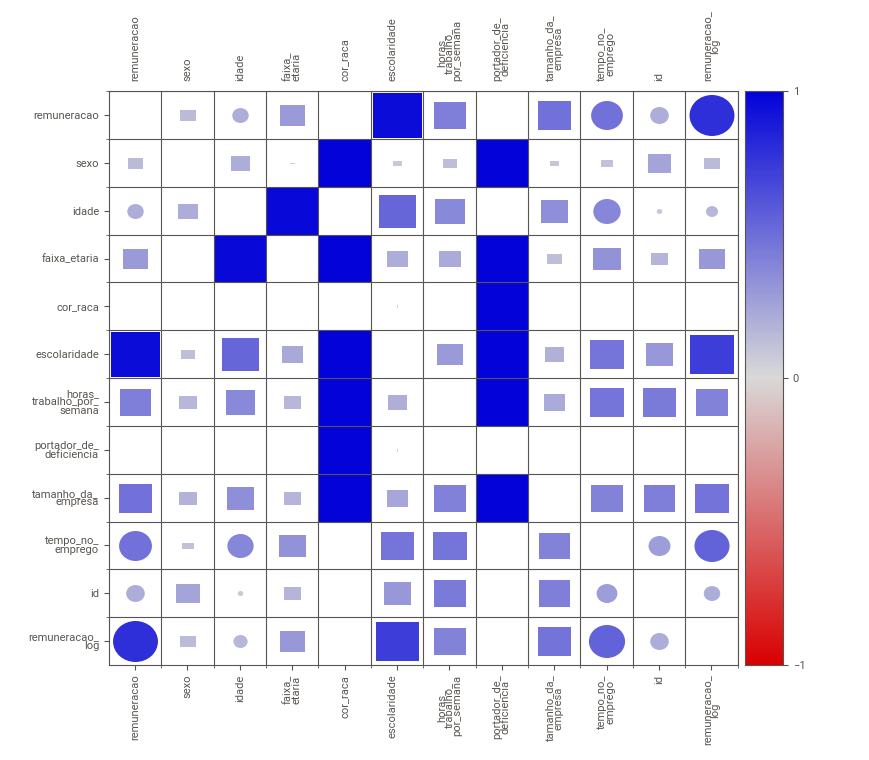
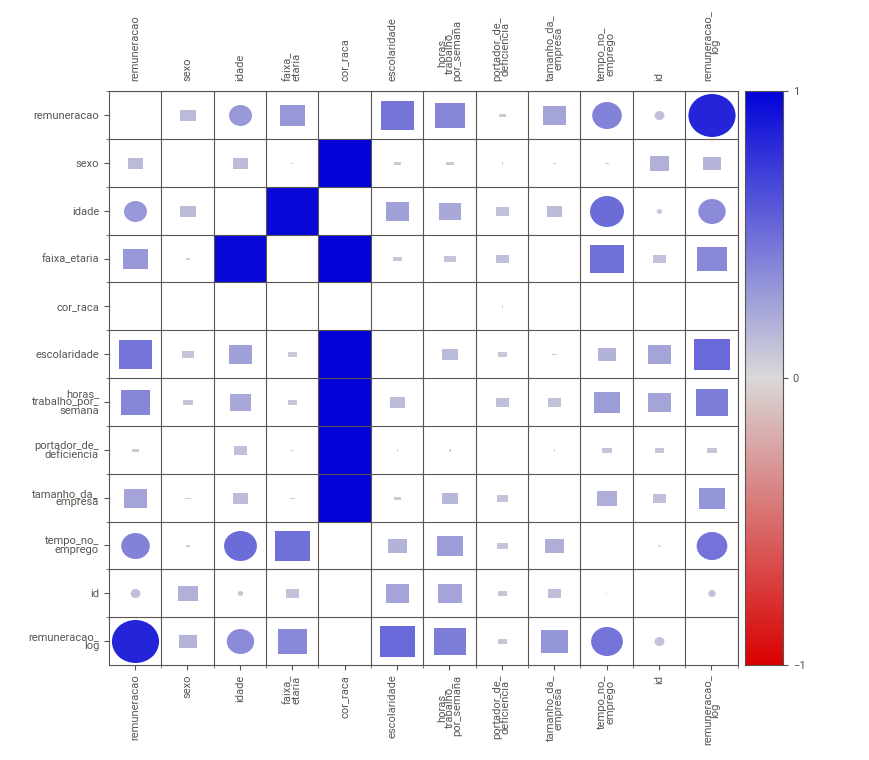

In [165]:
eda_cor.show_notebook()

In [154]:
pd.DataFrame(stats.f_oneway(df_train.loc[df_train.cor_raca==9], 
                            df_train.loc[df_train.cor_raca==8])[1], 
             index = df_train.columns, columns = ['Cor: 9 X 8'])

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\stats\stats.py:3709: F_onewayConstantInputWarning: Each of the input arrays is constant;the F statistic is not defined or infinite
  warnings.warn(F_onewayConstantInputWarning())


,Cor: 9 X 8
sexo,2.473053e-02
idade,3.548296e-04
faixa_etaria,3.538953e-04
cor_raca,0.000000e+00
escolaridade,2.713513e-05
horas_trabalho_por_semana,2.272992e-02
portador_de_deficiencia,4.377963e-03
tamanho_da_empresa,1.155714e-31
tempo_no_emprego,8.588887e-28
remuneracao,3.961936e-08


### 7. Escolaridade

<AxesSubplot:xlabel='escolaridade'>

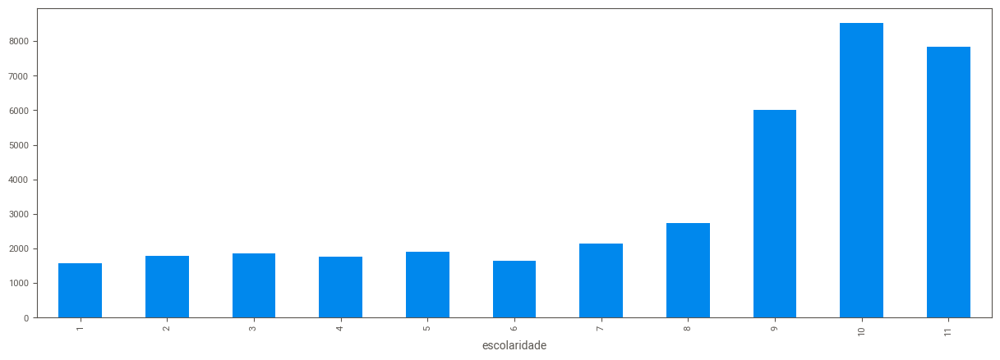

In [112]:
plt.figure(figsize=(15, 5))
df_train.groupby('escolaridade')['remuneracao'].mean().plot(kind='bar')

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<AxesSubplot:xlabel='escolaridade', ylabel='remuneracao'>

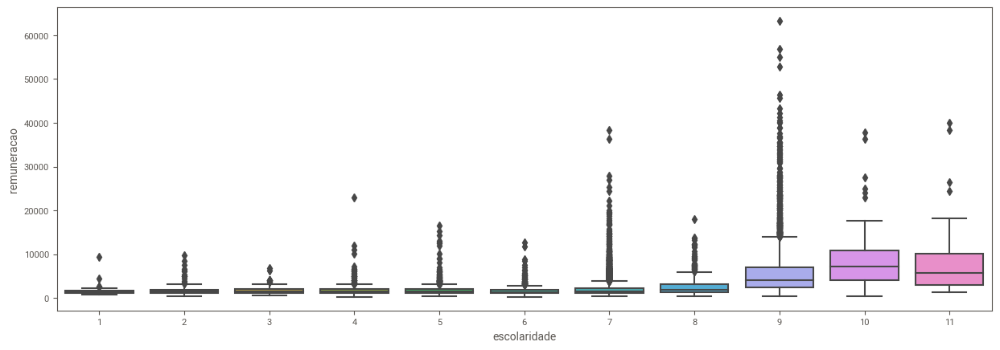

In [155]:
plt.figure(figsize=(15, 5))
sns.boxplot(x = 'escolaridade', y ='remuneracao', data=df_train)

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<AxesSubplot:xlabel='escolaridade', ylabel='remuneracao_log'>

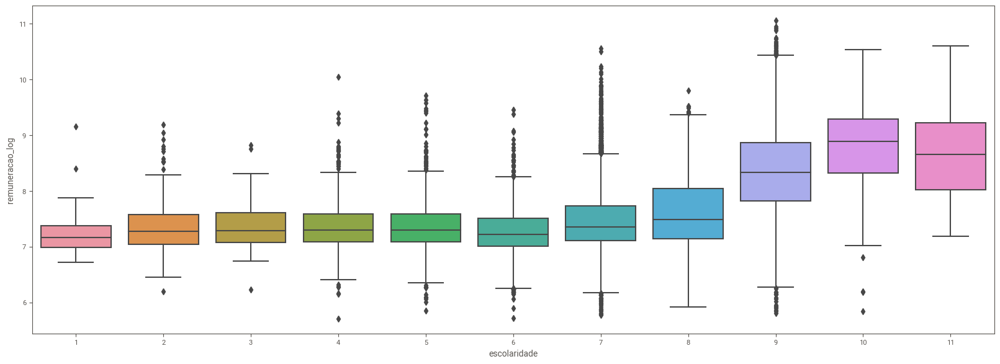

In [156]:
plt.figure(figsize=(20, 7))
sns.boxplot(x = 'escolaridade', y ='remuneracao_log', data=df_train)

Nota: Observa-se uma mudança na reta de regressão quando x = horas de trabalho para escolaridade igual a doutorado

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


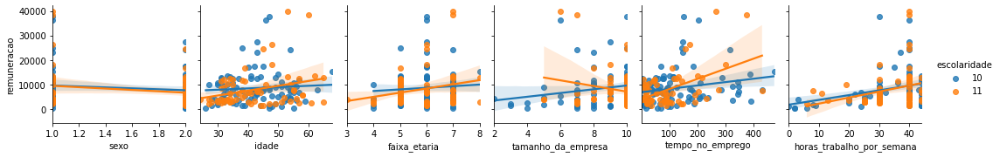

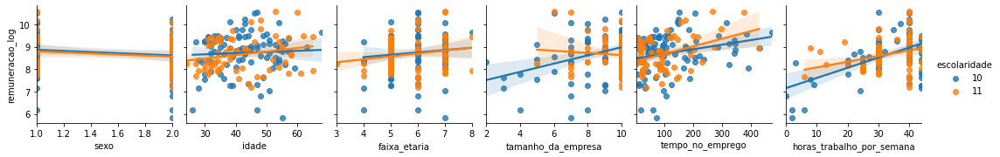

In [29]:
sns.pairplot(df_train[df_train.escolaridade >=10], 
            x_vars=['sexo', 'idade', 'faixa_etaria',
                    'tamanho_da_empresa', 'tempo_no_emprego', 'horas_trabalho_por_semana'], 
            y_vars = ['remuneracao'],
            hue = 'escolaridade',
            kind = 'reg')

sns.pairplot(df_train[df_train.escolaridade >=10], 
            x_vars=['sexo', 'idade', 'faixa_etaria',
                    'tamanho_da_empresa', 'tempo_no_emprego', 'horas_trabalho_por_semana'], 
            y_vars = ['remuneracao_log'],
            hue = 'escolaridade',
            
            kind = 'reg')

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


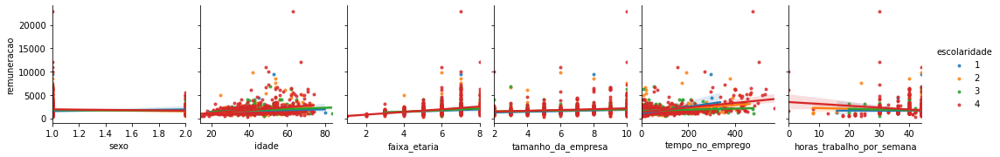

In [36]:

sns.pairplot(df_train[(df_train.escolaridade < 5) & (df_train.escolaridade > 0) ], 
            x_vars=['sexo', 'idade', 'faixa_etaria',
                    'tamanho_da_empresa', 'tempo_no_emprego', 'horas_trabalho_por_semana'], 
            y_vars = ['remuneracao'],
            hue = 'escolaridade',
            markers = '.',
            kind = 'reg')

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


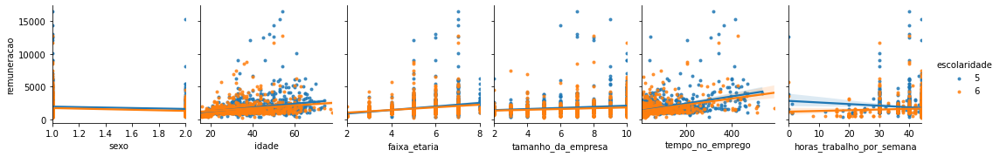

In [37]:
sns.pairplot(df_train[(df_train.escolaridade < 7) & (df_train.escolaridade > 4)], 
            x_vars=['sexo', 'idade', 'faixa_etaria',
                    'tamanho_da_empresa', 'tempo_no_emprego', 'horas_trabalho_por_semana'], 
            y_vars = ['remuneracao'],
            hue = 'escolaridade',
             markers = '.',
            kind = 'reg')

Escolaridade segundo IPEA

|Código|Descrição|IPEA| Outra Classificação|
|---|---|---|---|
|1|Analfabeto|Nível 1|1|
|2|Até 5ª incompleto|Nível 1|1|
|3|5ª fund|1|
|4|5ª a 9ª fund|1|
|5|fund completo|Nível 2|1|
|6|médio incompleto|1|
|7|médio completo|Nível 3|2|
|8|superior incompleto|2|
|9|superior completo|Nível 4|4
|10|mestrado|Nívevl 5|5|
|11|doutorado|5|

***

### 6. Idade

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='idade', ylabel='Density'>

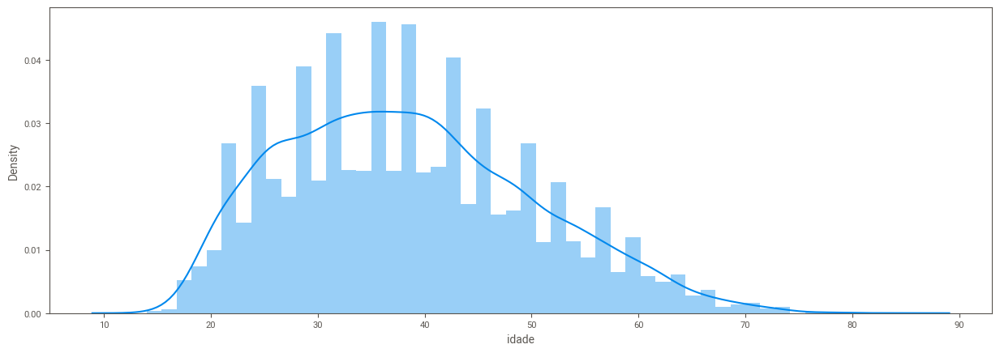

In [157]:
plt.figure(figsize=(15, 5))
sns.distplot(df_train.idade, hist=True)

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<AxesSubplot:xlabel='idade'>

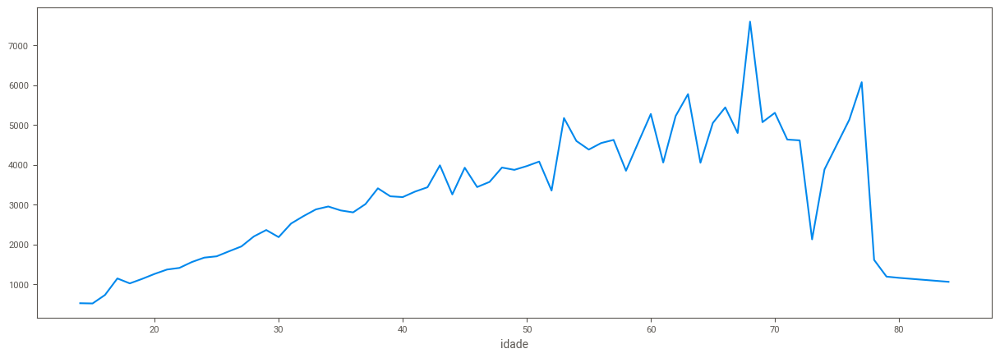

In [158]:
plt.figure(figsize=(15, 5))
df_train.groupby('idade')['remuneracao'].mean().plot(kind='line')